# 1. Importing Modules

In [1]:
from modalyzer.EFDD import FDD_SVD_Diagram, FDD_ModeShape, FDD_Damping
from modalyzer.SSI import SSI_Alg, psd_func, svd_psd, stabilization_diagram
from modalyzer.PolyMAX import PolyMAX, independent_mode_shape
from modalyzer.Preprocess import preprocess, results_table, choose_modes
from modalyzer.ITD import ITD_alg
from modalyzer.ModeShape import draw_mode_shapes, draw_MAC_diagram



import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

plt.rcParams["font.family"] = "Serif"
plt.rcParams['font.size'] = 12

# 2. Qatar Data

## 2.2. Reading csv Files (Undamage)



In [2]:
df_data = {'AU':pd.read_csv(f'data_qatar.csv', header = None)}
# for i in range(1,5):
#     df[f'AD{i}'] = pd.read_csv(f'Data_Qatar_GS/AD{i}.csv', header = None)
df_data['AU']

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,0.000000,-0.002393,-0.002489,-0.004280,-0.007097,-0.014100,-0.003038,-0.005753,-0.006714,-0.005339,...,-0.002243,-0.006778,-0.007051,-0.017991,-0.011358,-0.002683,-0.002964,-0.014538,0.000275,-0.029294
1,0.000977,0.001336,-0.009209,0.008050,-0.013097,-0.010397,0.001883,-0.016211,-0.107335,-0.018953,...,-0.001584,-0.007977,-0.004632,-0.018229,-0.009791,-0.003253,0.000388,-0.017616,0.002596,-0.029456
2,0.001950,-0.007358,0.013234,0.001991,0.009638,-0.015835,0.013009,-0.077513,-0.047958,-0.081948,...,-0.002066,-0.009080,-0.011033,-0.017896,-0.010343,-0.000287,-0.004114,-0.018570,-0.003710,-0.027483
3,0.002930,0.021219,-0.018150,-0.031487,-0.022496,0.010140,-0.039876,-0.034198,0.100790,-0.035690,...,-0.000427,-0.015421,-0.000951,-0.023056,-0.006746,0.000748,0.000849,-0.017358,-0.000548,-0.029362
4,0.003910,0.011253,-0.058244,-0.016432,-0.058346,-0.002061,-0.071501,0.063820,-0.052306,0.057550,...,-0.014022,0.000246,-0.002637,-0.008312,-0.019360,-0.000417,0.001250,-0.013299,-0.002091,-0.033233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,97.700000,0.216375,0.121456,0.324656,0.275138,0.300621,0.166053,-0.110398,-0.389440,0.218670,...,0.026825,-0.078264,0.152181,-0.201740,0.192369,-0.136154,0.056039,-0.035532,-0.075265,0.009872
99996,97.700000,0.150843,0.314500,-0.041551,0.248905,0.273017,-0.305923,-0.334023,0.153062,-0.675049,...,0.058554,-0.096699,-0.245133,0.063414,0.044305,0.131256,0.091957,0.035343,0.021115,0.027120
99997,97.700000,0.499549,-0.123340,0.251500,0.200838,0.179358,-0.097937,-0.179855,-0.538090,-0.150925,...,-0.168725,0.015141,-0.115252,-0.055172,-0.070435,0.152392,0.165930,0.074117,0.114012,0.076372
99998,97.700000,-0.180825,0.558891,0.143191,0.166605,0.031341,-0.034710,-0.199574,-0.048250,-0.057604,...,0.057173,-0.311802,0.023503,-0.145380,-0.025380,0.071545,0.162434,0.150625,0.201534,0.073261


## Qatar Grandstand

In [ ]:
# Load data from an Excel file
# Assume the data is in the first sheet and starts in the first column
f_time = df_data['AU'].iloc[:,0]
delta_t = f_time[1]-f_time[0] # sampling interval [s]

df = df_data['AU']
x = df.to_numpy() # Convert DataFrame to numpy array

extracted_y = x[:,1:]
# Duration of the signal [s]
T = delta_t * (len(extracted_y))
Tmax = delta_t * (len(extracted_y) - 1)
delta_f = 1 / Tmax # sampling frequency [Hz]
t_qatar = np.arange(0, Tmax + delta_t, delta_t) # time array

####### Showing a part of data

# Plot unfiltered signals
# plt.figure(figsize=(15, 5))
# for i in range(extracted_y.shape[1]):
#     plt.plot(t_qatar[0:1023], extracted_y[0:1023, i], label=f'Channel {i+1}')


# plt.xlabel('Time [s]')
# plt.ylabel('Acceleration [m/s^2]')
# plt.title('Unfiltered Signals')
# plt.legend()
# plt.grid()
# plt.show()

# Preprocess

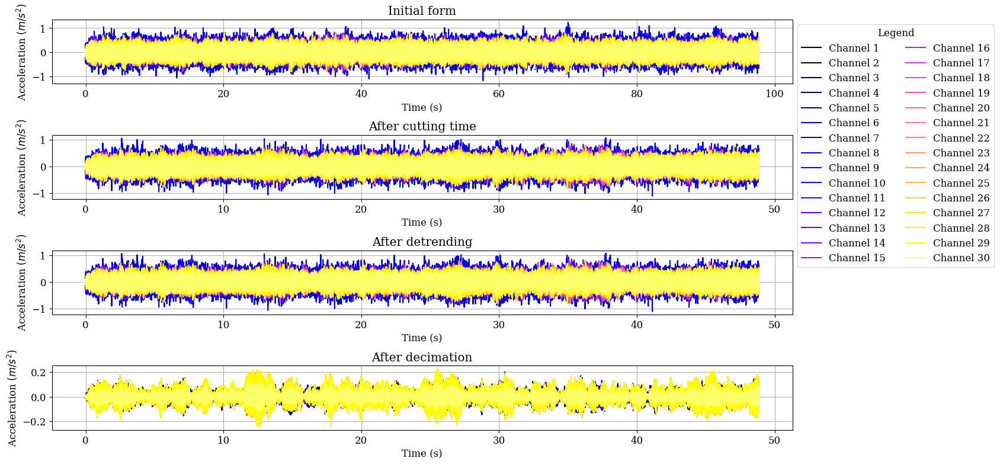

In [7]:
pp_sig_qatar, time_qatar = preprocess(extracted_y, t_qatar, do_detrend=True, do_sync=False, time_limit=[0, 0.5], 
                                      channels_to_remove=[], decimate_downsample=7, filter_lim=0, filter_order=5)
dt = time_qatar[1] - time_qatar[0]

# Mode Shape function (specific for QUGS structure) 

In [8]:
def Qatar_Mode_Shape(Mode_shapes_input, freq_list=None):

    if isinstance(freq_list, (tuple, list)):
        if len(freq_list) != len(Mode_shapes_input):
            freq_list = None

    Mode_shapes = Mode_shapes_input
    alpha = np.pi/9
    beta = np.pi/4
    L1 = 5*0.77
    L2 = 6*0.77
    Still_Coord = {'x':[],'y':[]}
    Still_Coord_vert = {'x':[],'y':[]}

    Changed_Coord = []
    for i in range(len(Mode_shapes)):
        Changed_Coord.append({'x':[],'y':[]})

    Changed_Coord_vert = []
    for i in range(len(Mode_shapes)):
        Changed_Coord_vert.append({'x':[],'y':[]})

    A_Coord = np.zeros((6,2,2))
    A_Coord[0,1,:] = L1*np.array([np.sin(alpha),0])
    A_Coord[0,0,:] = A_Coord[0,1,:] + L2*np.array([np.cos(beta), np.sin(alpha)])
    # A_Coord[5,1,:] = L1*np.array([0, np.cos(alpha)])
    # A_Coord[5,0,:] = A_Coord[5,1,:] + L2*np.array([np.cos(beta), np.sin(alpha)])

    for i in range(1,6):
        A_Coord[i,1,:] = (1-i/5)*L1*np.array([np.sin(alpha),0]) + i/5*L1*np.array([0, np.cos(alpha)])
        A_Coord[i,0,:] = A_Coord[i,1,:] + L2*np.array([np.cos(beta), np.sin(alpha)])


    Still_Coord['x'].append(A_Coord[5,0,0])
    Still_Coord['y'].append(A_Coord[5,0,1])
    for i in range(6):
        for j in range(2):
            Still_Coord['x'].append(A_Coord[i,j,0])
            Still_Coord['y'].append(A_Coord[i,j,1])
    Still_Coord['x'].append(A_Coord[0,1,0])
    Still_Coord['y'].append(A_Coord[0,1,1])


    scale_factor = 0.8

    LinkLine = np.zeros((len(Mode_shapes), 30, 2, 2))
    LinkLine_Still = np.zeros((len(Mode_shapes), 30, 2, 2))

    dofs_Coord = np.zeros((len(Mode_shapes),6,5,2))


    for mode_num in range(len(Mode_shapes)):
        for i in range(6):
            for j in range(5):
                # print(f'i: {i}')
                # print(f'j: {j}')
                # print(f'mode_num: {mode_num}')
                A_Coord[i,1,:]
                (1-(j+1)/6)*L2*np.array([np.cos(beta), np.sin(alpha)])
                scale_factor*np.array([0, Mode_shapes[mode_num][5*i+j]])
                dofs_Coord[mode_num,i,j,:] = A_Coord[i,1,:] + (1-(j+1)/6)*L2*np.array([np.cos(beta), np.sin(alpha)]) + scale_factor*np.array([0, Mode_shapes[mode_num][5*i+j]])
                LinkLine[mode_num,5*i+j,0,:] =  A_Coord[i,1,:] + (1-(j+1)/6)*L2*np.array([np.cos(beta), np.sin(alpha)])
                LinkLine[mode_num,5*i+j,1,:] =  dofs_Coord[mode_num,i,j,:]



    for mode_num in range(len(Mode_shapes)):
        for i in range(6):
            Changed_Coord[mode_num]['x'].append(A_Coord[i,0,0])
            Changed_Coord[mode_num]['y'].append(A_Coord[i,0,1])
            for j in range(5):
                Changed_Coord[mode_num]['x'].append(dofs_Coord[mode_num,i,j,0])
                Changed_Coord[mode_num]['y'].append(dofs_Coord[mode_num,i,j,1])
            Changed_Coord[mode_num]['x'].append(A_Coord[i,1,0])
            Changed_Coord[mode_num]['y'].append(A_Coord[i,1,1])




    for mode_num in range(len(Mode_shapes)):
        for j in range(5):
            for i in range(6):
                Changed_Coord_vert[mode_num]['x'].append(dofs_Coord[mode_num,i,j,0])
                Changed_Coord_vert[mode_num]['y'].append(dofs_Coord[mode_num,i,j,1])


        for j in range(5):
            for i in range(6):
                Still_Coord_vert['x'].append(LinkLine[mode_num,5*i+j,0,0])
                Still_Coord_vert['y'].append(LinkLine[mode_num,5*i+j,0,1])

    # fig, axis = plt.subplots(len(Mode_shapes),1, sharey=True, figsize=(10, 4*len(Mode_shapes)))
    # plt.subplots_adjust(wspace=0.2, hspace=0.1)
    for mode_num in range(len(Mode_shapes)):
        fig, axis = plt.subplots(1,1, sharey=True, figsize=(10, 6))
        plt.subplots_adjust(wspace=0.2, hspace=0.1)
        # plt.subplot(len(Mode_shapes), 1, mode_num+1)
        # ax1 = plt.gca()
        ax1 = axis

        # Add frequency annotation at the top (if provided)
        if freq_list:
            ax1.set_title(f"frequency = {freq_list[mode_num]:.2f} Hz", pad=12)


        plt.axis('off')
        ax1.set_xticks([])
        ax1.set_yticks([])
        for i in range(1, len(Changed_Coord[mode_num]['x'])):
            if i%7 == 0 and i != 0:
                continue
            plt.plot( [Changed_Coord[mode_num]['x'][i-1],Changed_Coord[mode_num]['x'][i]], [Changed_Coord[mode_num]['y'][i-1],Changed_Coord[mode_num]['y'][i]], '-bo')
        for i in range(1, len(Changed_Coord_vert[mode_num]['x'])):
            if i%6 == 0 and i != 0:
                continue
            plt.plot( [Changed_Coord_vert[mode_num]['x'][i-1],Changed_Coord_vert[mode_num]['x'][i]], [Changed_Coord_vert[mode_num]['y'][i-1],Changed_Coord_vert[mode_num]['y'][i]], '-bo')
            # print(([Changed_Coord[mode_num]['x'][i-1],Changed_Coord[mode_num]['x'][i]], [Changed_Coord[mode_num]['y'][i-1],Changed_Coord[mode_num]['y'][i]]))
        plt.plot( [Still_Coord['x'][0],Still_Coord['x'][1]], [Still_Coord['y'][0],Still_Coord['y'][1]], '-r', linewidth = 0.5)
        plt.plot( [Still_Coord['x'][-2],Still_Coord['x'][-1]], [Still_Coord['y'][-2],Still_Coord['y'][-1]], '-r', linewidth = 0.5)
        for i in range(2, len(Still_Coord['x']), 2):
            plt.plot( [Still_Coord['x'][i-1],Still_Coord['x'][i]], [Still_Coord['y'][i-1],Still_Coord['y'][i]], '-r', linewidth = 0.5)
        for i in range(1, len(Still_Coord_vert['x'])):
            if i%6 == 0 and i != 0:
                continue
            plt.plot( [Still_Coord_vert['x'][i-1],Still_Coord_vert['x'][i]], [Still_Coord_vert['y'][i-1],Still_Coord_vert['y'][i]], '-r', linewidth = 0.5)


        for i in range(30):
            plt.plot([LinkLine[mode_num,i,0,0], LinkLine[mode_num,i,1,0]], [LinkLine[mode_num,i,0,1],LinkLine[mode_num,i,1,1]],'--m')
            if Mode_shapes[mode_num][i] != 0:
                    x_text = (LinkLine[mode_num,i,0,0]+LinkLine[mode_num,i,1,0])/2
                    y_text = (LinkLine[mode_num,i,0,1]+LinkLine[mode_num,i,1,1])/2
                    plt.text(x_text, y_text, f"{'{:.2f}'.format(Mode_shapes[mode_num][i])}", fontsize = 'small')
    plt.show()

# FDD-EFDD on Qatar

## Part 1 (Getting SVD of PSD)

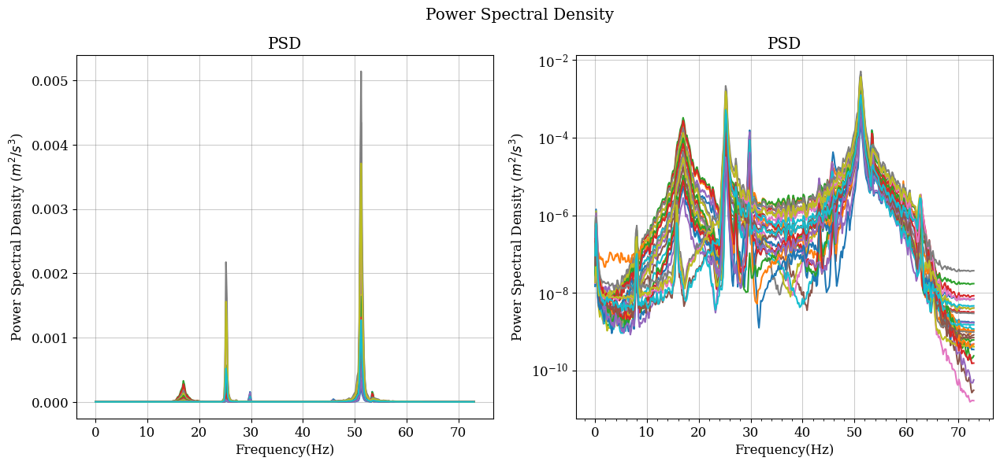

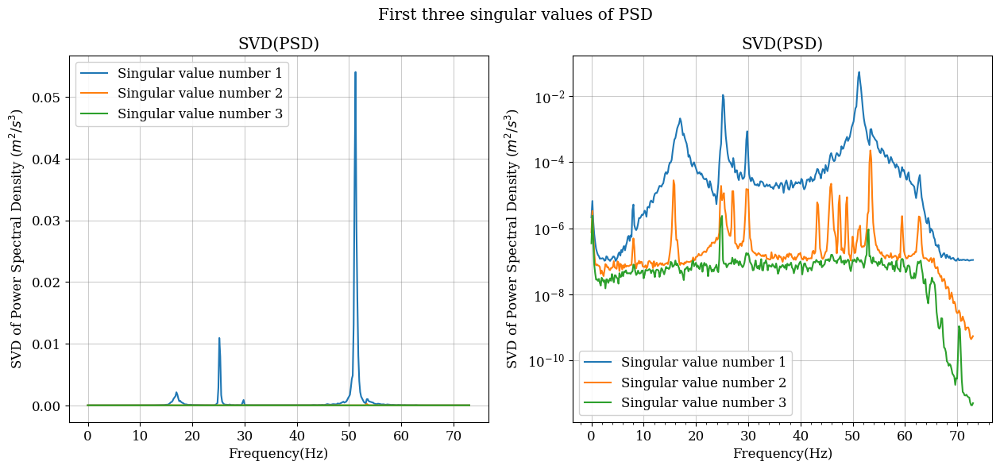

In [9]:
PSD_mat, f_psd, ss1, UU, t = FDD_SVD_Diagram(pp_sig_qatar, dt, window='hann', nseg=10 ,pov=0.5, show_semilog=True)
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.get_window.html#scipy.signal.get_window

## Choosing frequencies

In [10]:
## Natural Frequencies = [ [ ], [ ], [ ] ]
## Which n-th list in the main list contains frequencies read from the n-th singular value diagram

Natural_frequencies = [[16.781, 25.262, 27.136, 29.814, 43.293, 45.792, 51.234, 53.469, 62.842], [15.799, 24.815, 25.261, 27.047, 29.724, 43.236, 45.861, 47.485, 48.860, 53.469]] ## Insert the Natural Frequencies Manually
EFDD_freqs = [item for sublist in Natural_frequencies for item in sublist]

## part 2 (Getting mode shapes)

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\_tensor.py:1228: ComplexWarning:

Casting complex values to real discards the imaginary part



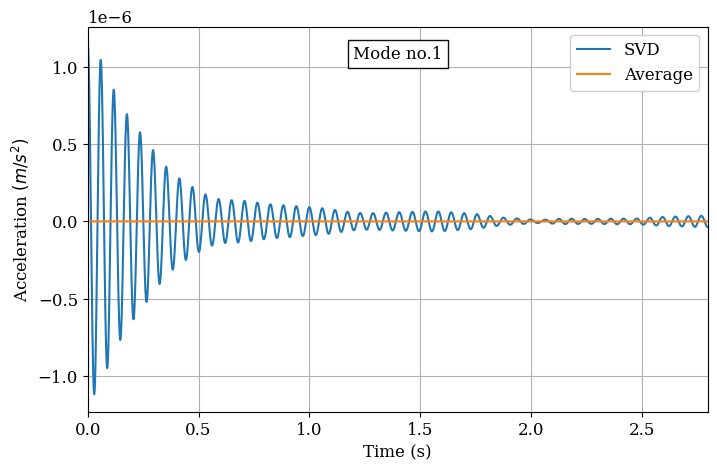

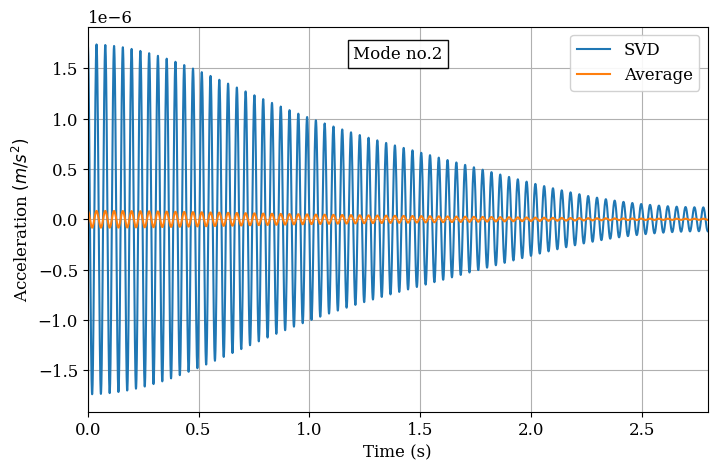

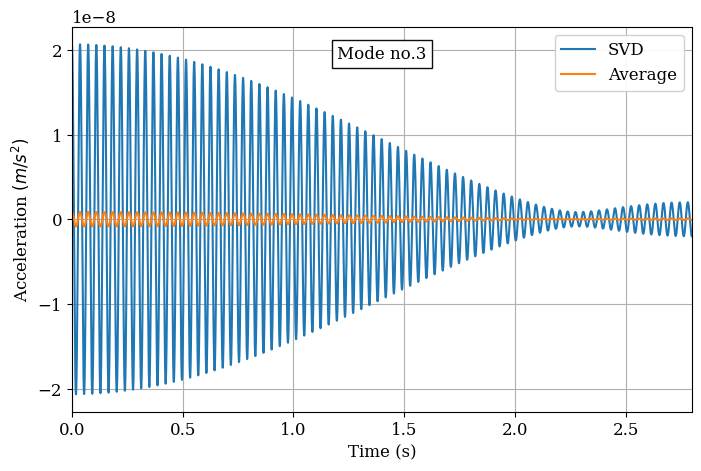

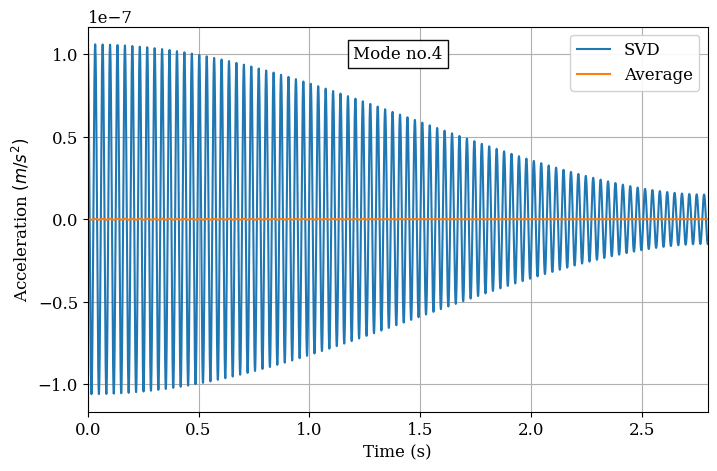

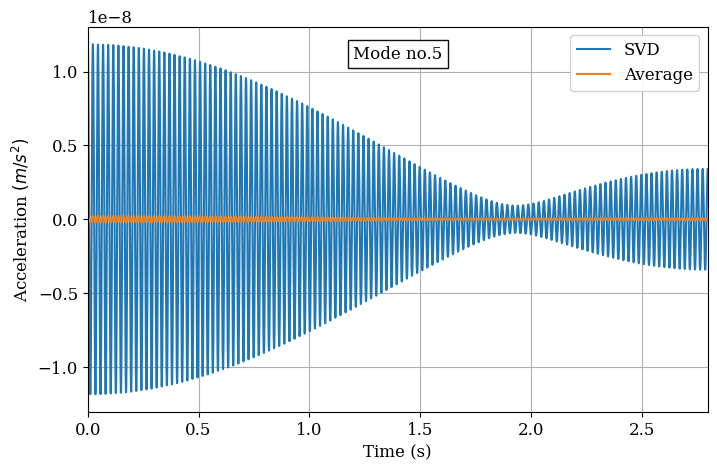

...

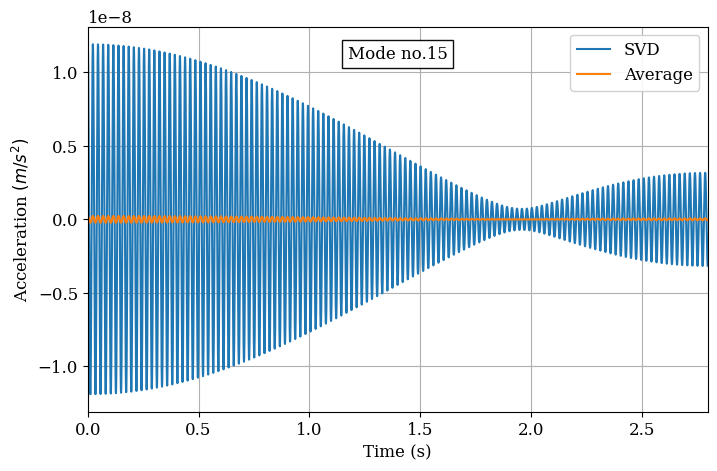

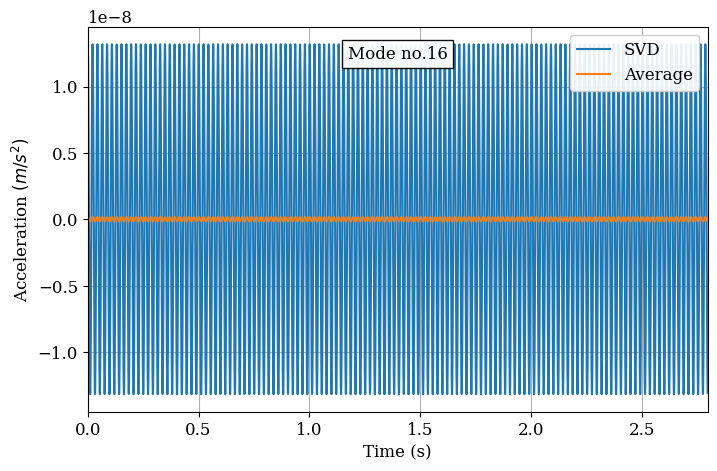

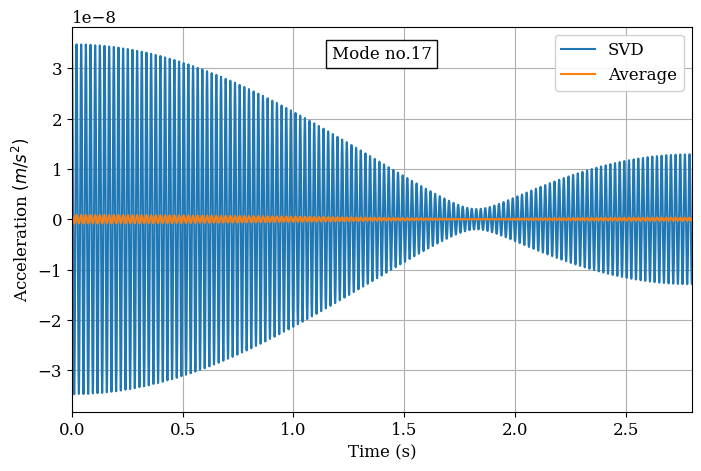

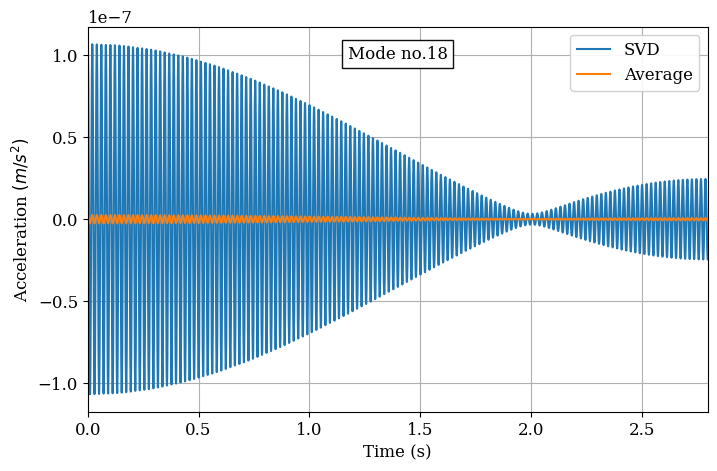

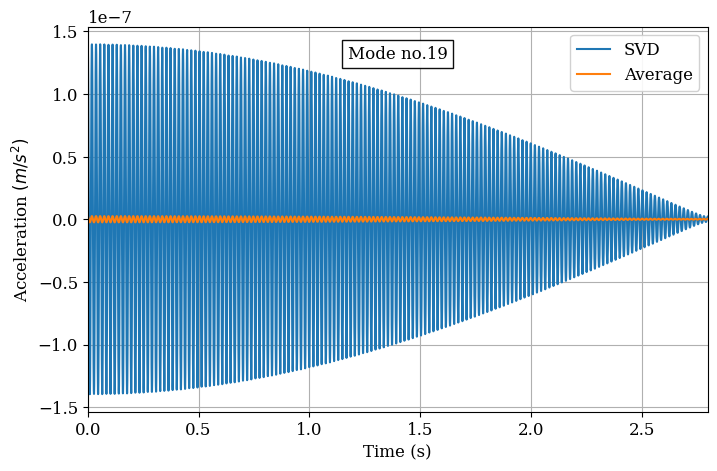

In [11]:
EFDD_Mode_shapes, SDOF, t_sdof = FDD_ModeShape(Natural_frequencies, PSD_mat, f_psd, ss1, UU, t,complex_mode_shape=True, MAC_Lim=0.9,plot_type='pyplot',show_mode_shape_number=True)

## Part 3 (Calculating damping ratios)

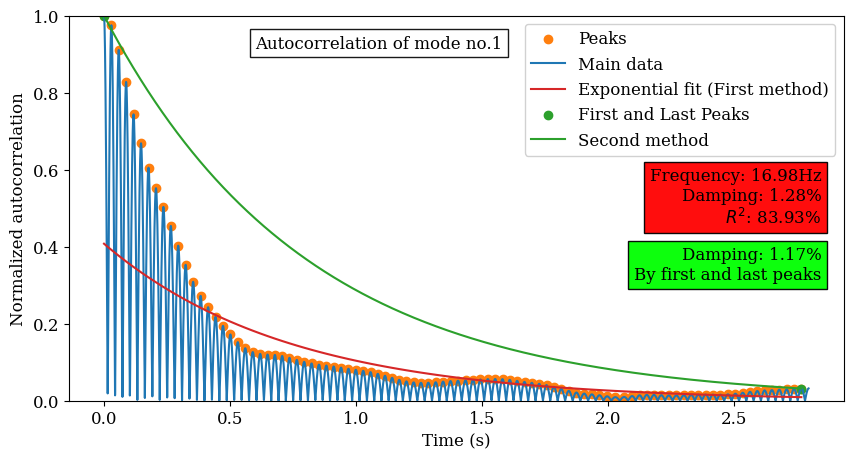

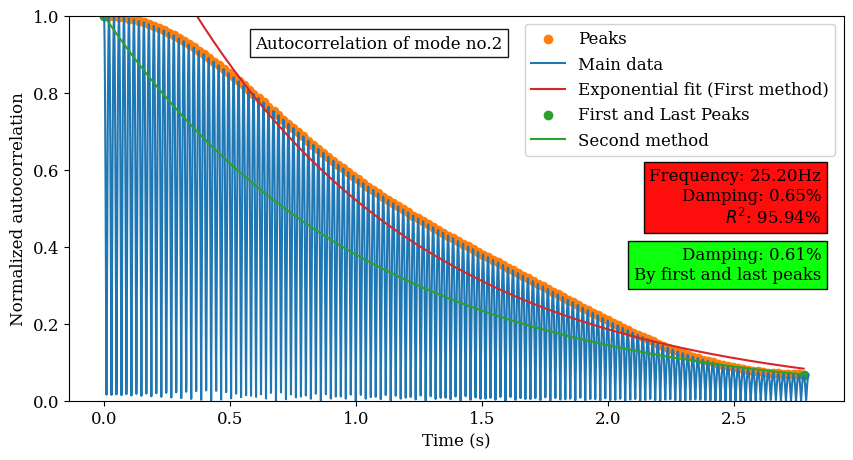

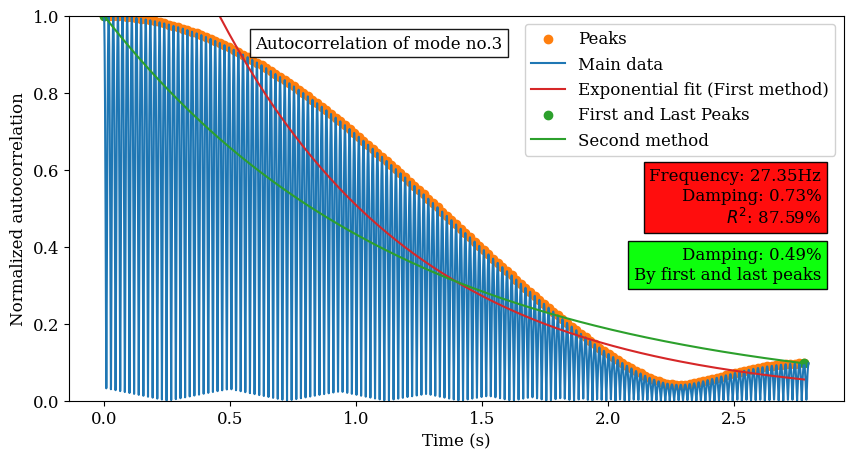

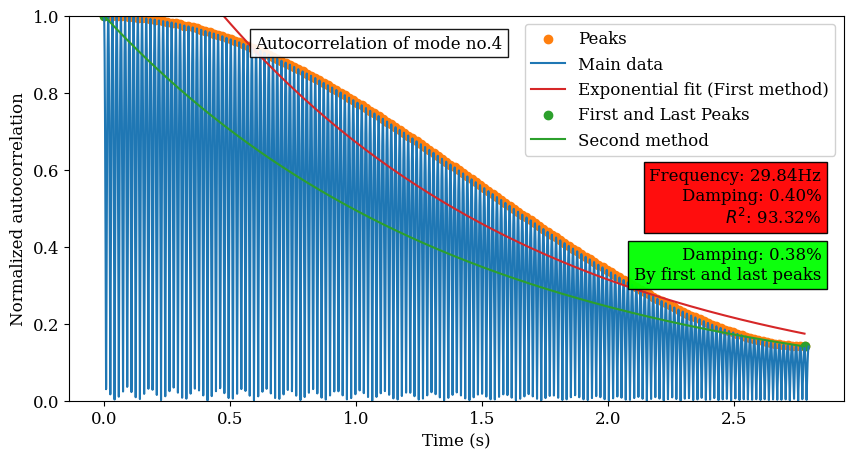

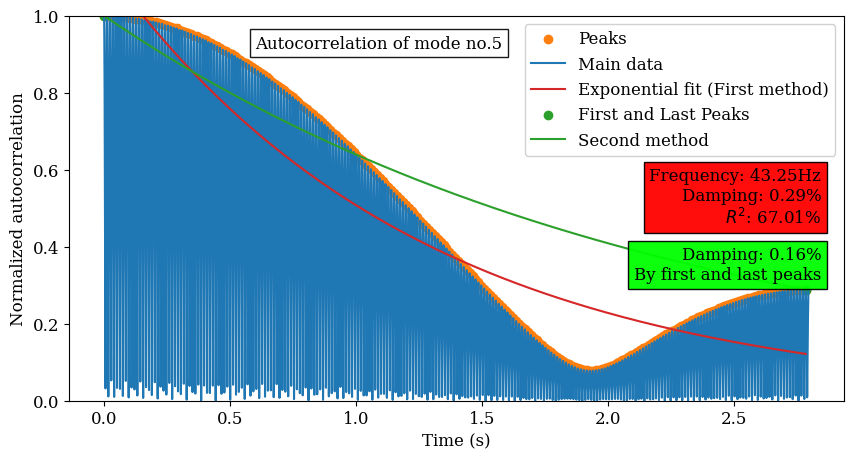

...

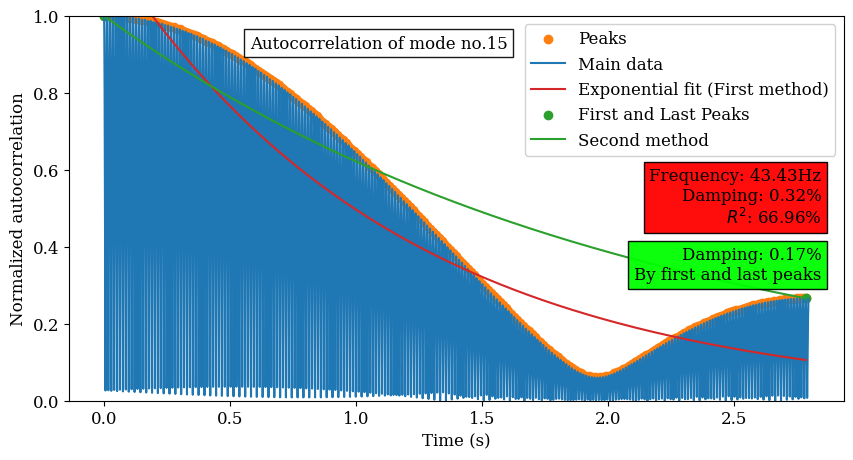

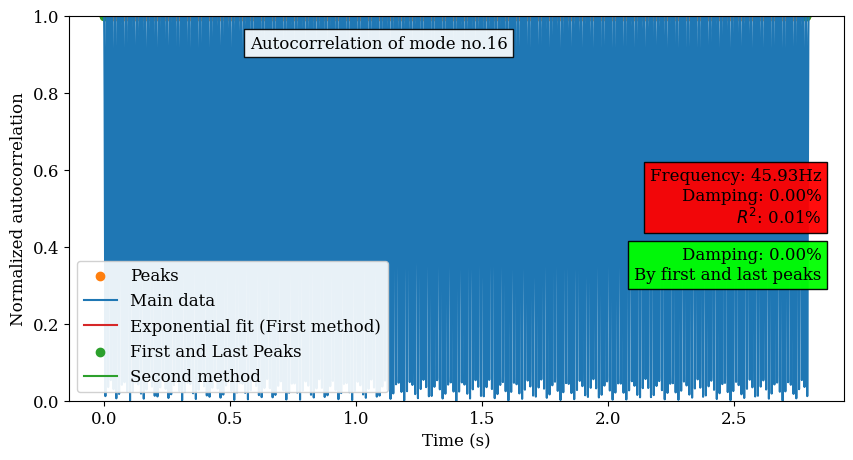

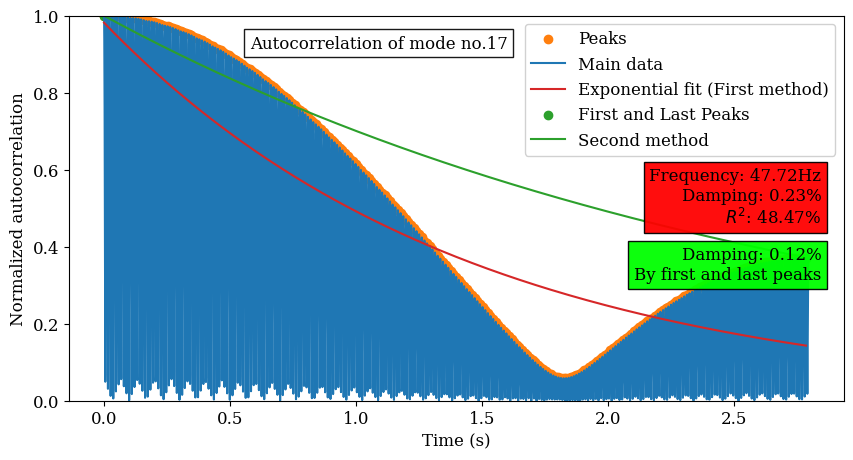

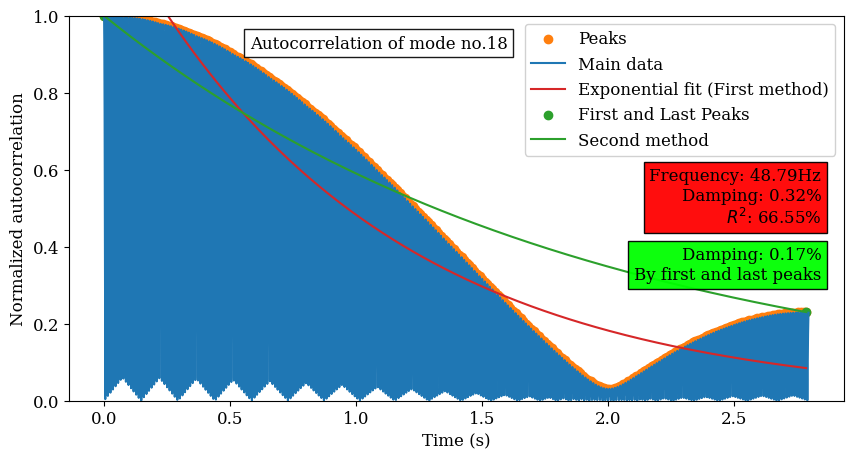

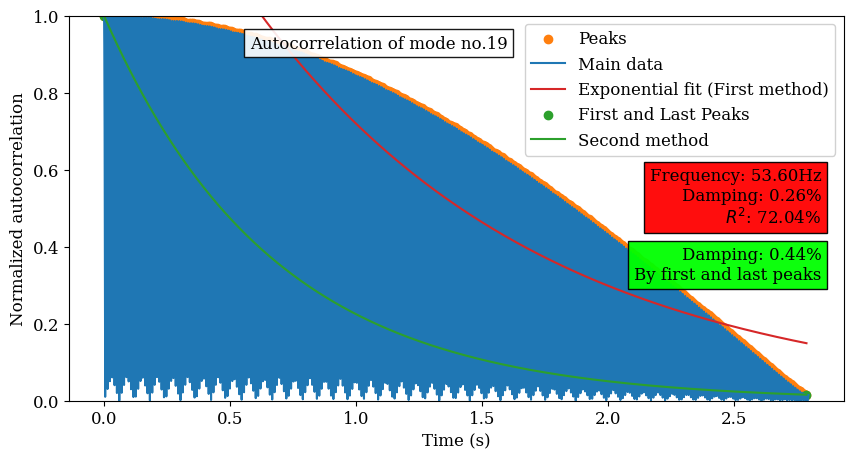

In [17]:
# With respect to SDOF autocorrelation diagrams, choose a time frame for modes
time_start = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
time_stop = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

# PSD_method:
# 1. 'svd' for using first singular value of PSD for inverse Fourier transform.
# 2. 'avg' for using average of all channels PSDs.
EFDD_damps, EFDD_Natural_frequencies = FDD_Damping(SDOF, t_sdof, [time_start, time_stop], 'all_peaks', PSD_method='svd',show_mode_shape_number=True)

In [27]:
results_table(EFDD_freqs, EFDD_damps)

,Frequencies,Damping Ratios
0,16.781,1.281137e-02
1,25.262,6.515176e-03
2,27.136,7.262923e-03
3,29.814,4.039226e-03
4,43.293,2.947561e-03
5,45.792,1.540201e-08
6,51.234,3.645517e-03
7,53.469,2.610154e-03
8,62.842,9.603781e-04
9,15.799,7.174435e-03


## Drawing mode shapes (For QUGS we have used a special drawing function)

In [21]:
EFDD_freqs_sorted, EFDD_damps_sorted, EFDD_Mode_shapes_sorted = choose_modes(EFDD_freqs, EFDD_damps, EFDD_Mode_shapes, mode_numbers=[9, 0, 1, 6])
results_table(EFDD_freqs_sorted, EFDD_damps_sorted)


,Frequencies,Damping Ratios
0,15.799,0.007174
1,16.781,0.012811
2,25.262,0.006515
3,51.234,0.003646


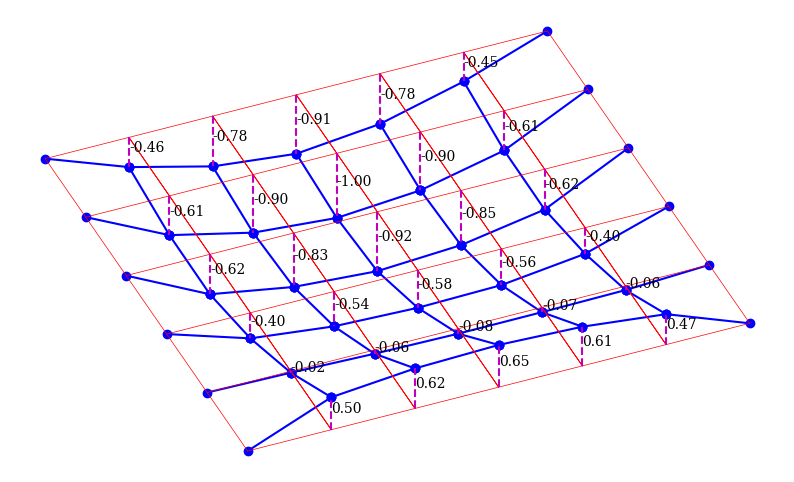

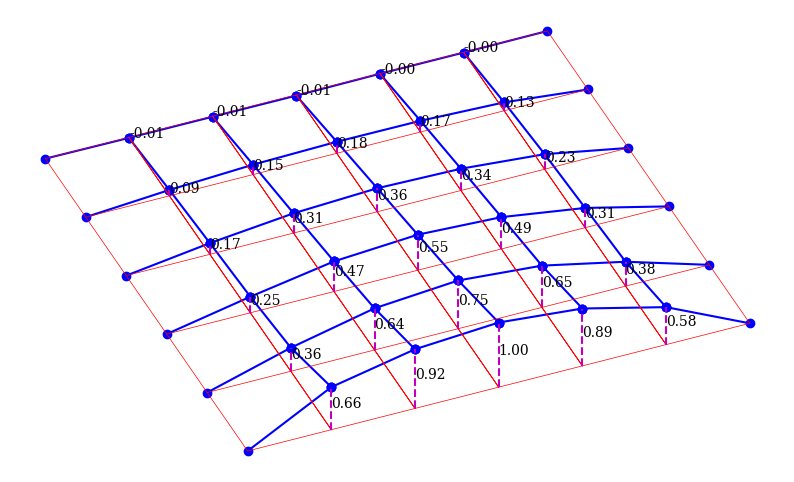

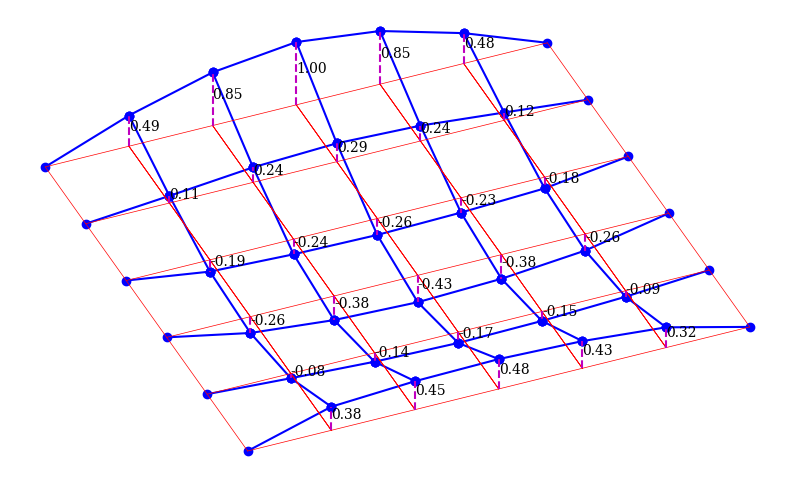

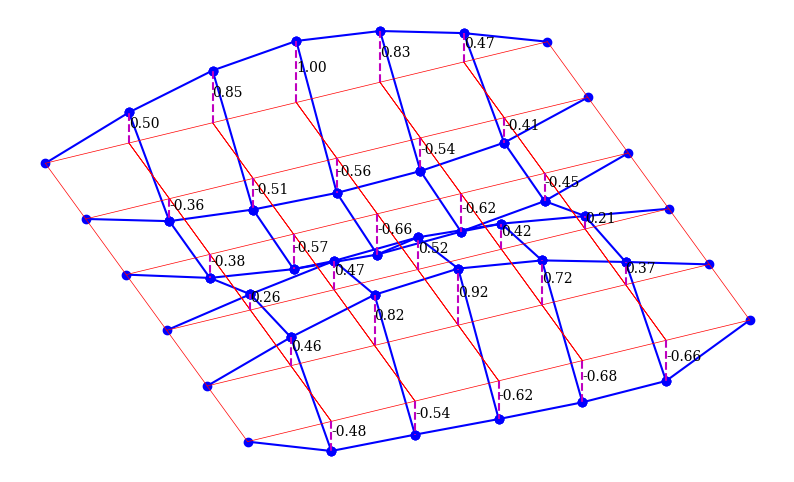

In [25]:
Qatar_Mode_Shape(EFDD_Mode_shapes_sorted)

# SSI on Qatar

## SSI-COV

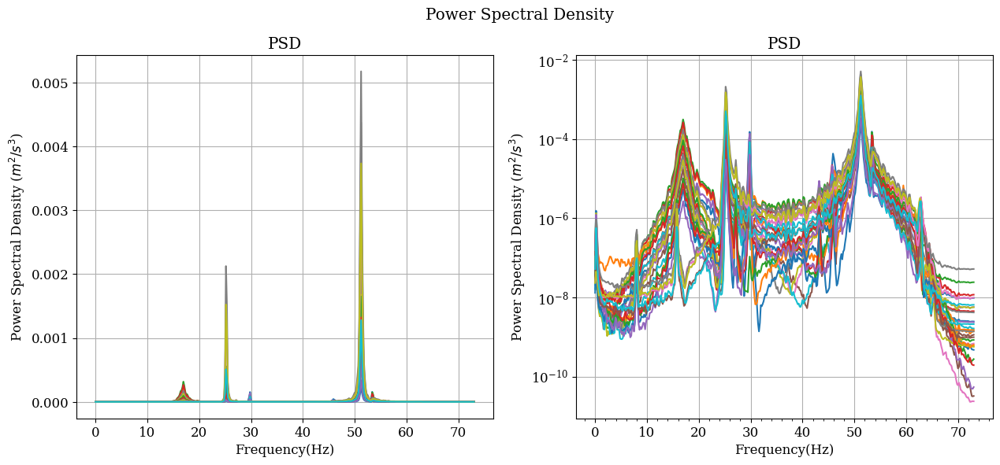

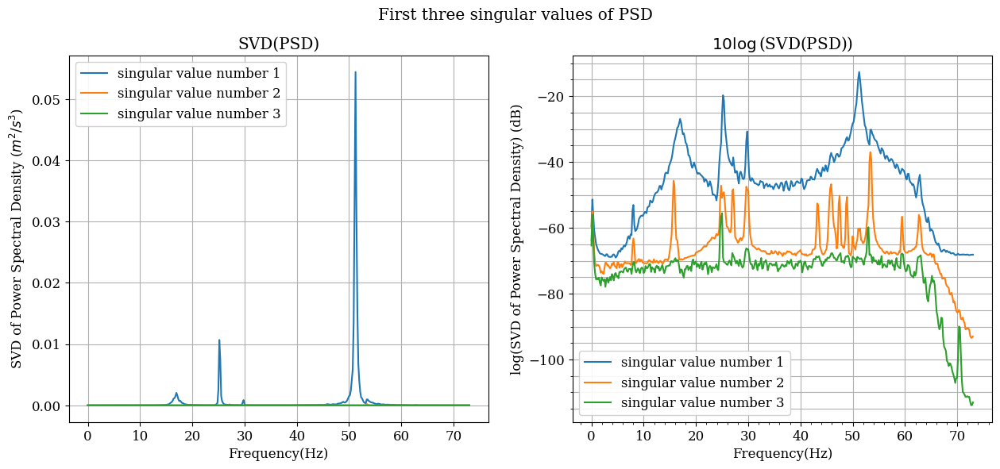

In [26]:
PSD_mat, f_psd = psd_func(pp_sig_qatar, dt,show_semilog=True, nseg=10 ,pov=0.8)
ss1, UU = svd_psd(PSD_mat, f_psd, show_semilog=False)

### SSI_COV (CVA)

In [42]:
################################## uncomment the method you want
alg = 'cva'
method = 1
lag = 30 # i
order = 50 # n
# cov:  l*i > n
# l = number of sensors

SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, SSI_Stable_phis = SSI_Alg(pp_sig_qatar,order,lag,dt,criteria = [0.01, 0.05, 0.02],alg=alg,method=method,Num_poles_to_accept_a_mode=5)

results_table(SSI_Stable_frequencies, SSI_Stable_zetas)

,Frequencies,Damping Ratios
0,16.881645,0.032903
1,18.251816,0.034479
2,25.222040,0.010470
3,29.776419,0.000763
4,45.874737,0.005304
5,48.058285,0.025722
6,51.246964,0.003193
7,53.346622,0.005828
8,53.477840,0.003754
9,60.327202,0.036918


c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning:

Casting complex values to real discards the imaginary part

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning:

Casting complex values to real discards the imaginary part



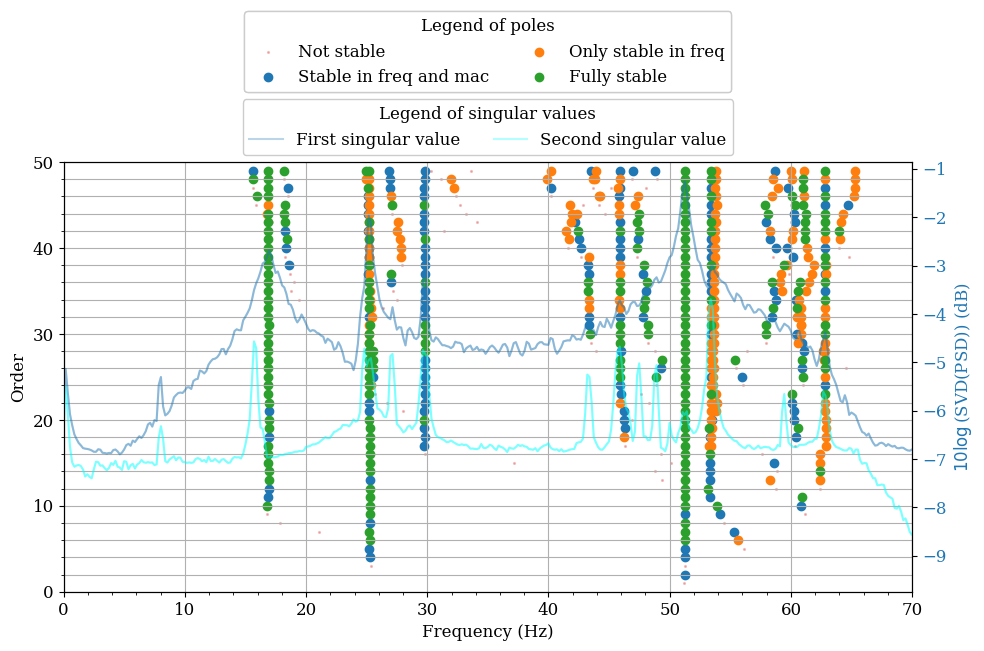

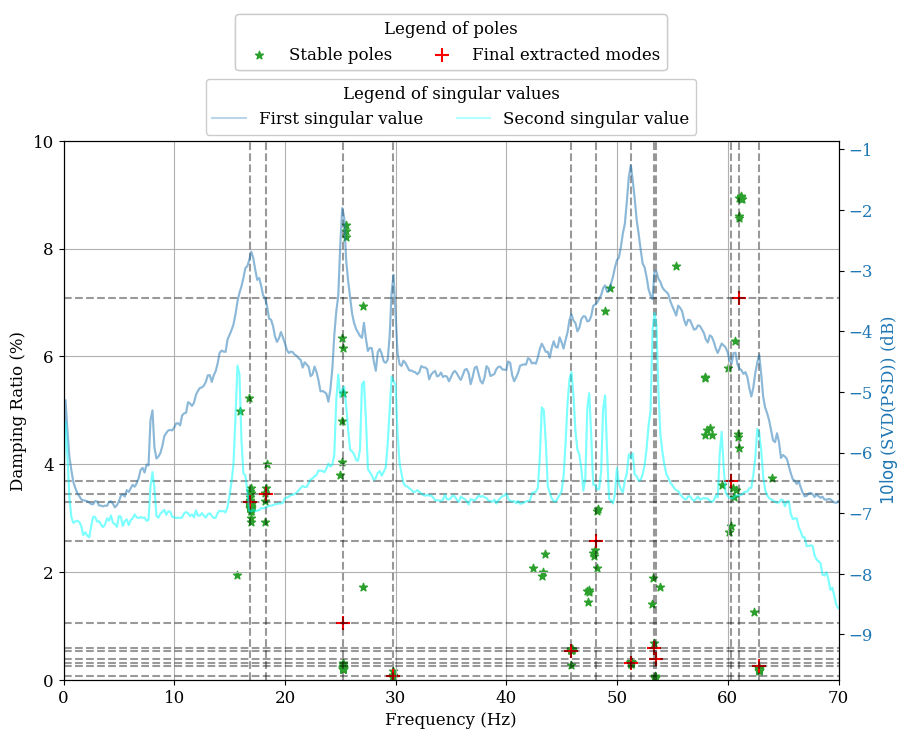

In [43]:
stabilization_diagram(SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, xlim=[0,70], ylim=[0,order], add_PSD_SVD=True, show_second_singular_value=True, f_psd=f_psd, ss1=np.log10(ss1), without_mode_shape=False)


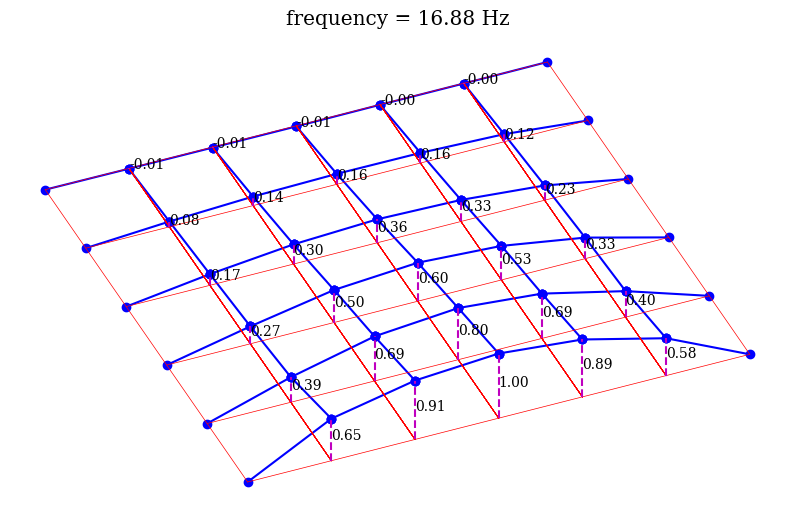

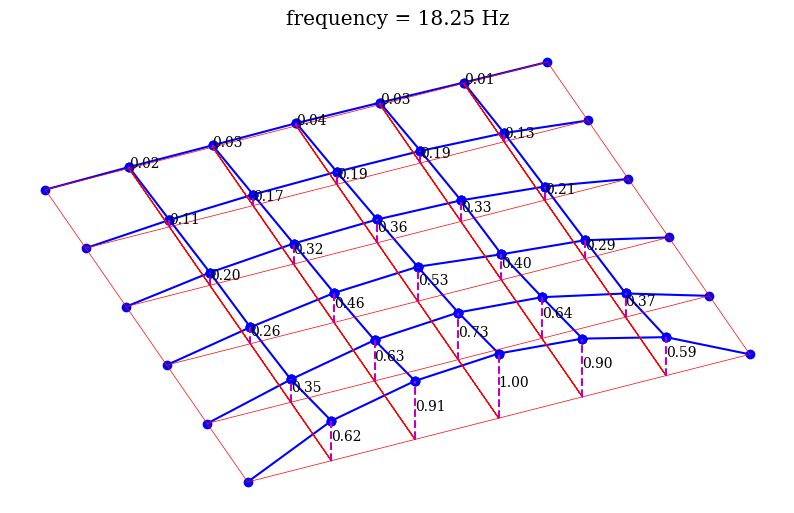

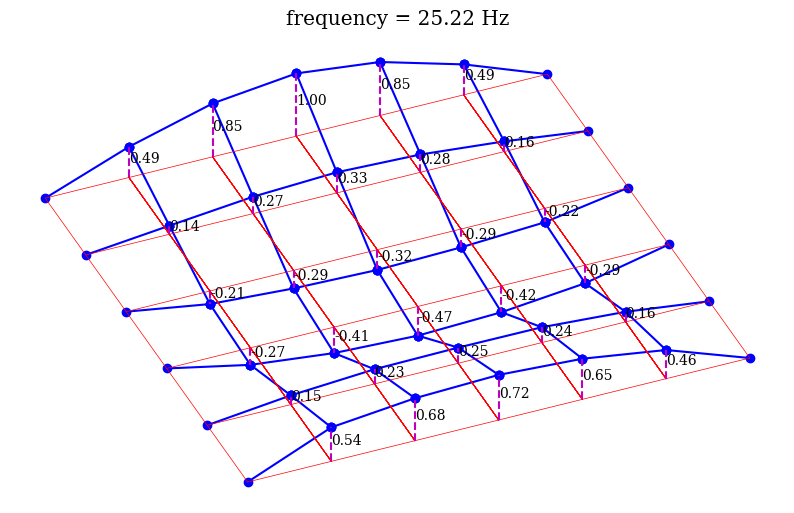

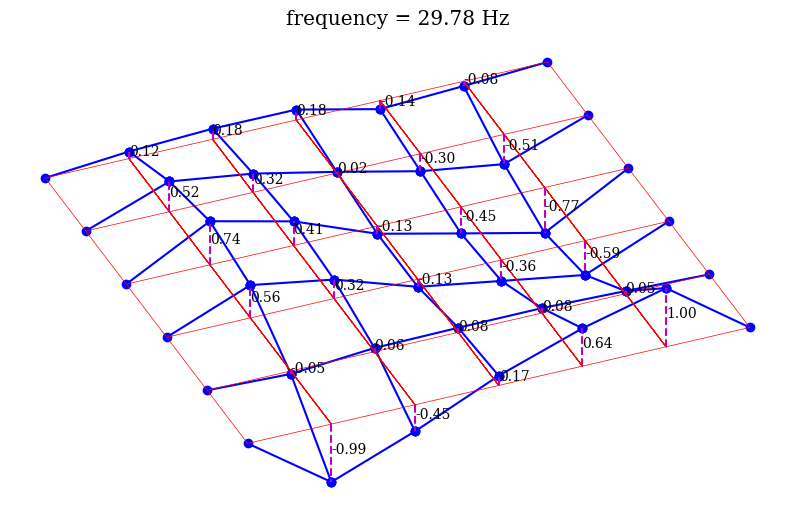

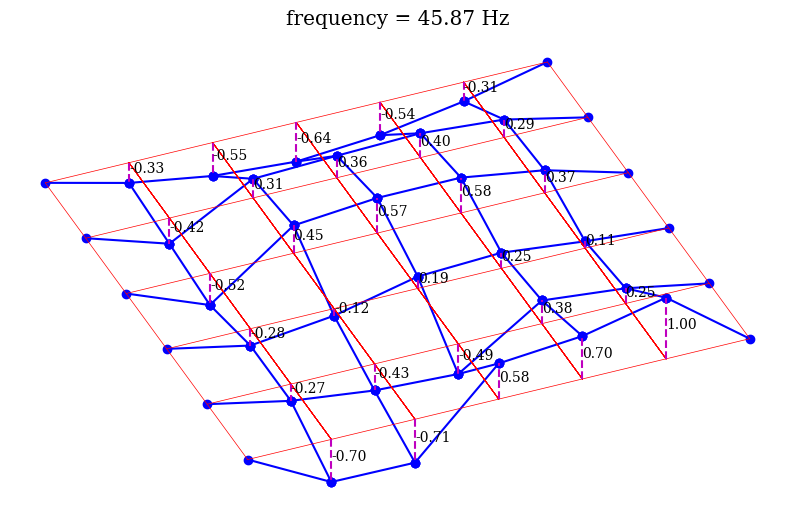

...

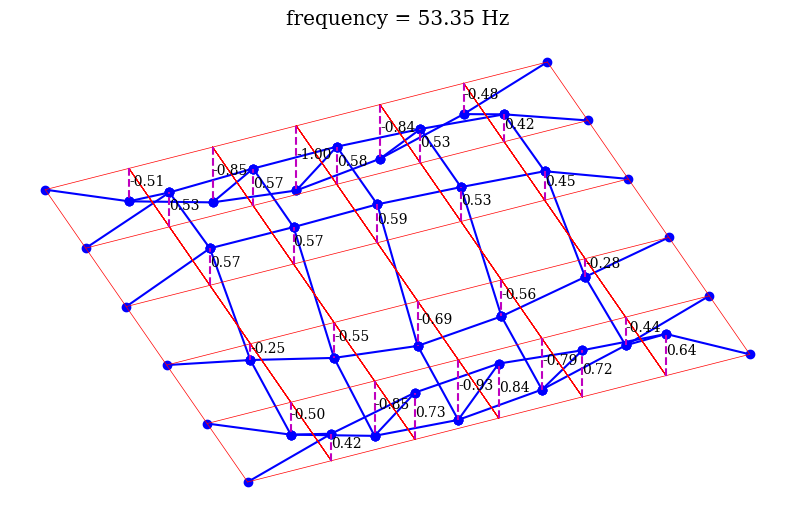

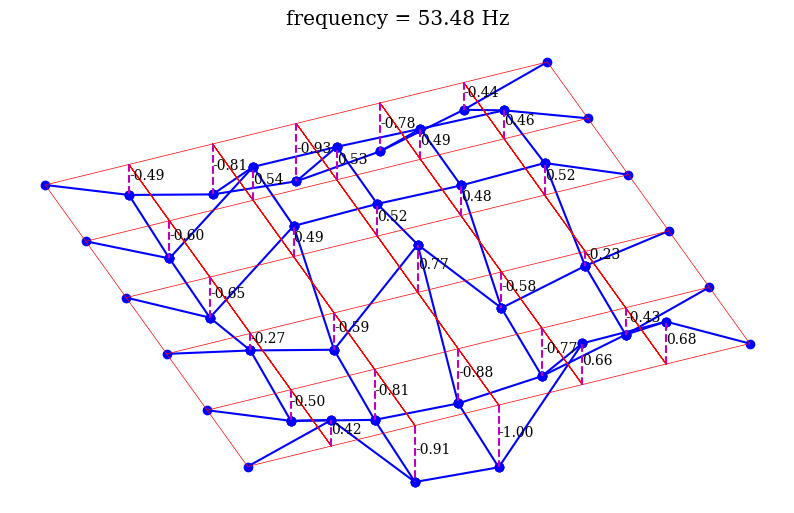

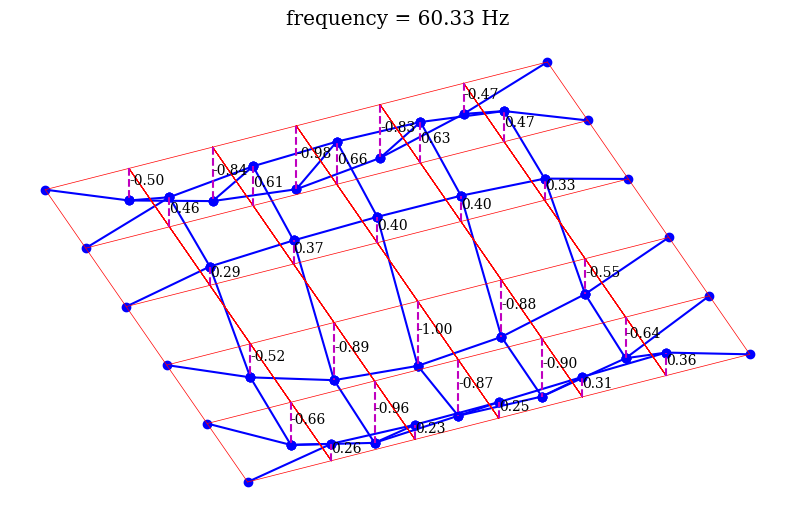

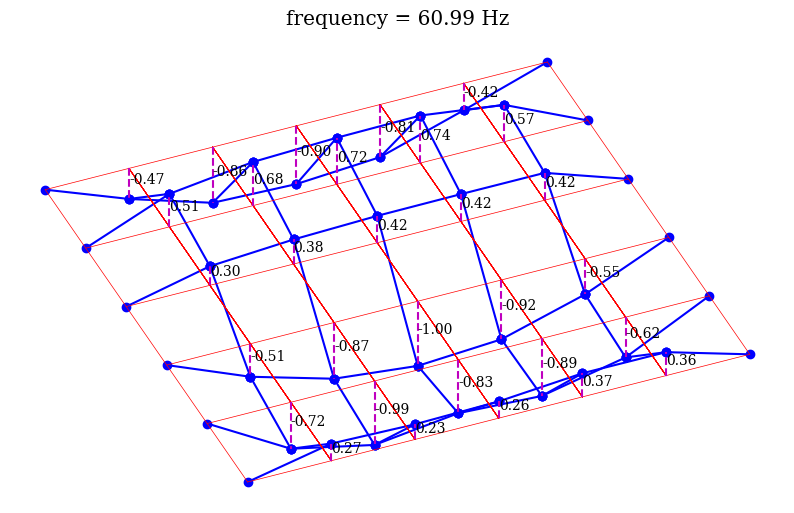

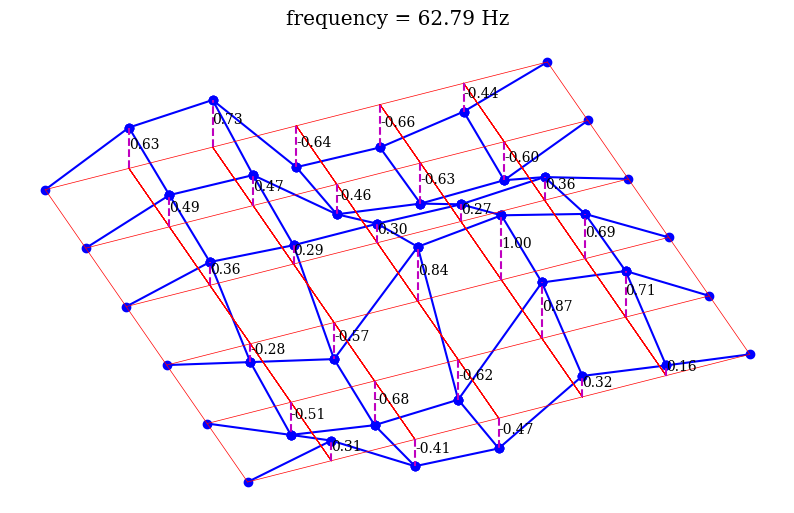

In [44]:
Qatar_Mode_Shape(SSI_Stable_phis, SSI_Stable_frequencies)


### SSI-COV (BR)

In [73]:
################################## uncomment the method you want
alg = 'cov'
uncertainty = False
method = 2
lag = 25 # i
order = 30 # n
# cov:  l*i > n
# l = number of sensors

SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, SSI_Stable_phis = SSI_Alg(
    pp_sig_qatar,order,lag,dt,criteria = [0.01, 0.05, 0.02], 
    alg=alg,method=method,Num_poles_to_accept_a_mode=5,
    uncertainty=uncertainty)
results_table(SSI_Stable_frequencies, SSI_Stable_zetas)


,Frequencies,Damping Ratios
0,16.899992,0.030932
1,25.216040,0.019858
2,29.778957,0.000966
3,45.999233,0.004802
4,51.256622,0.003080
5,52.573097,0.026895
6,53.384815,0.003399


c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning:

Casting complex values to real discards the imaginary part

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning:

Casting complex values to real discards the imaginary part



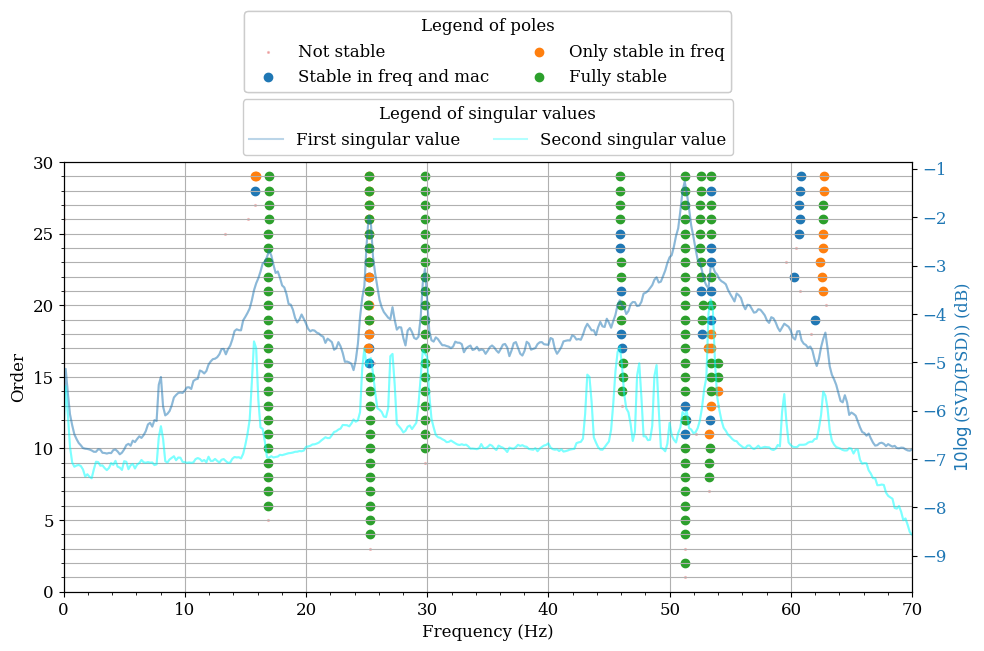

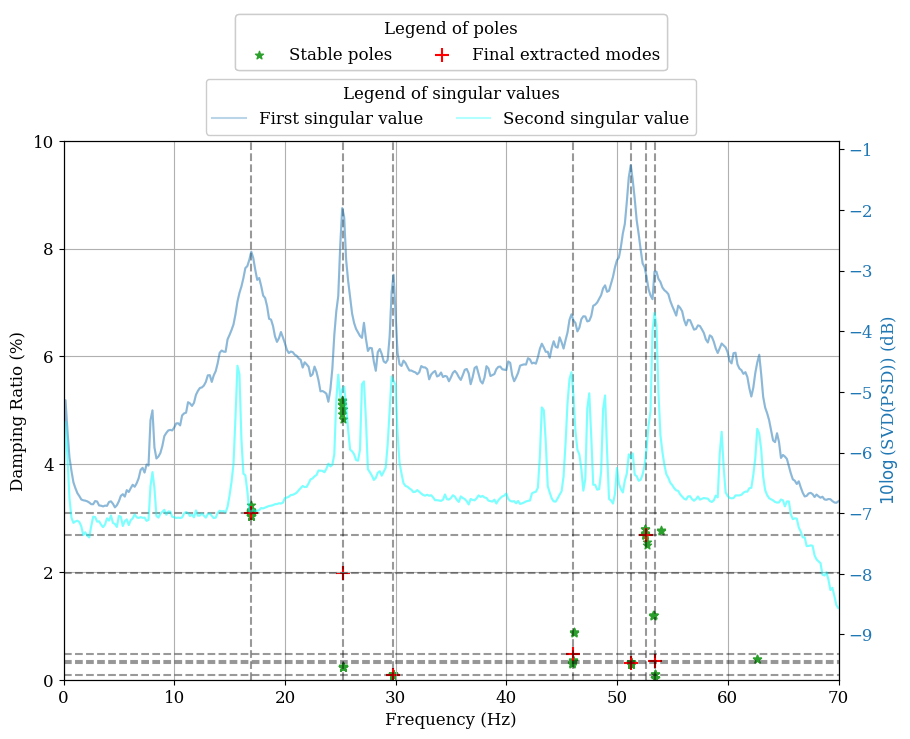

In [74]:
stabilization_diagram(SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, xlim=[0,70], ylim=[0,order], add_PSD_SVD=True, show_second_singular_value=True, f_psd=f_psd, ss1=np.log10(ss1), without_mode_shape=False)

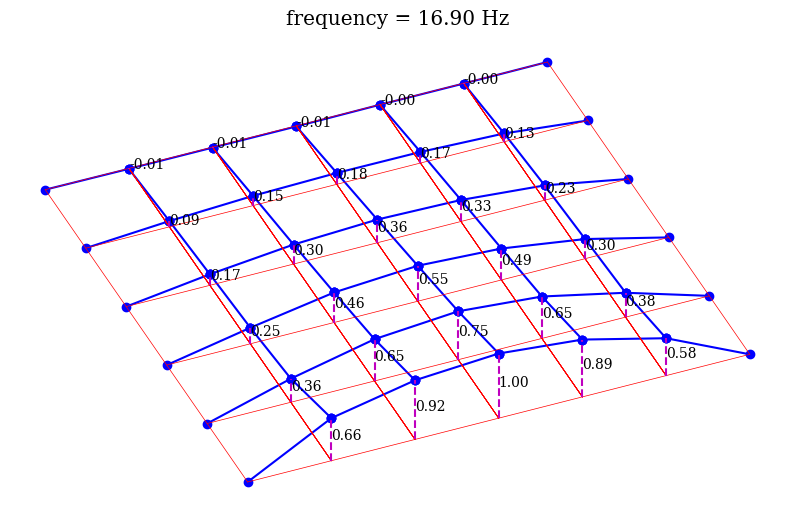

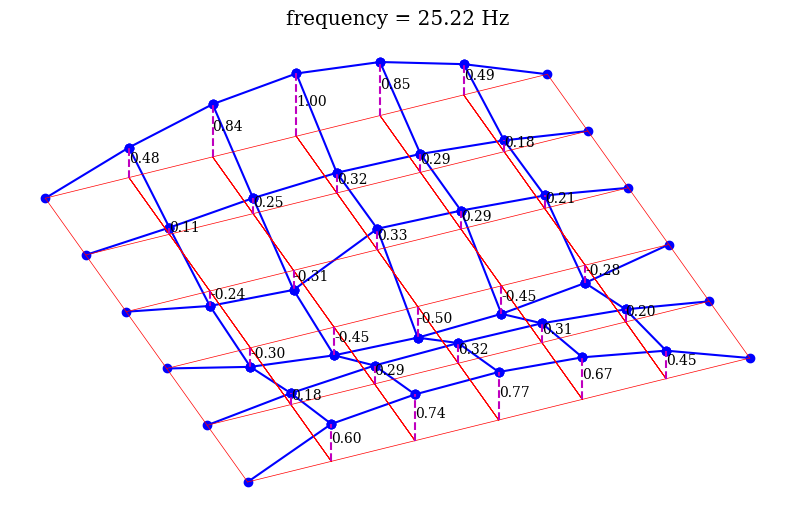

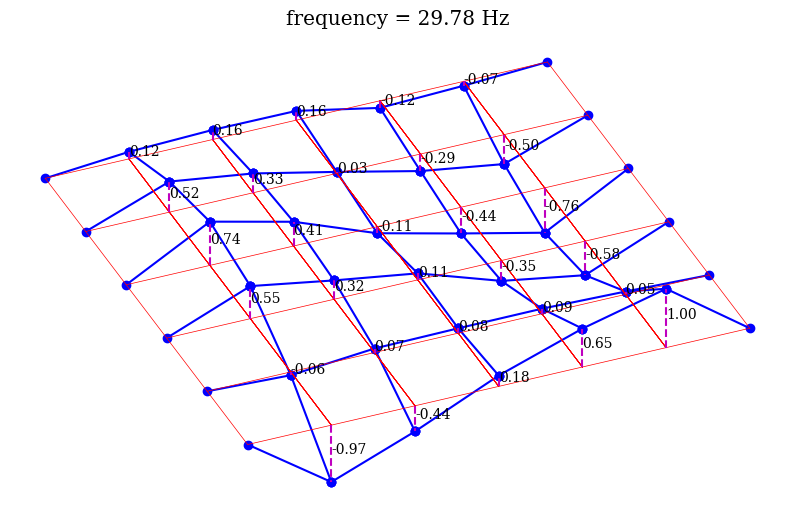

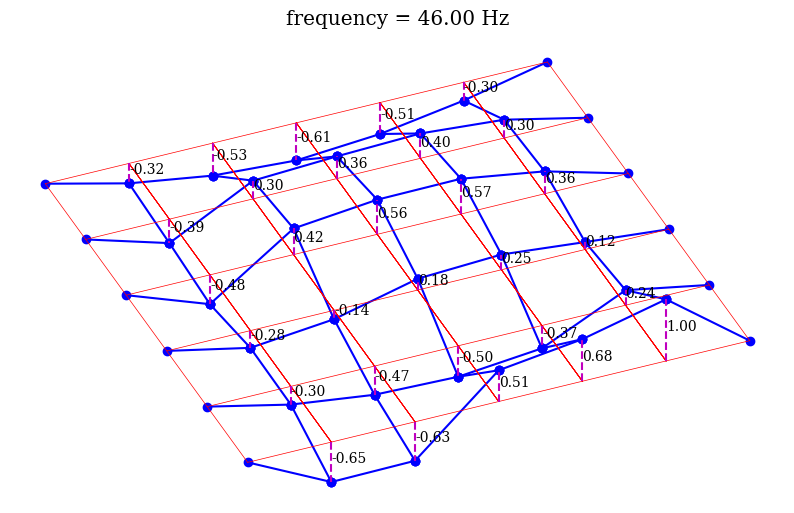

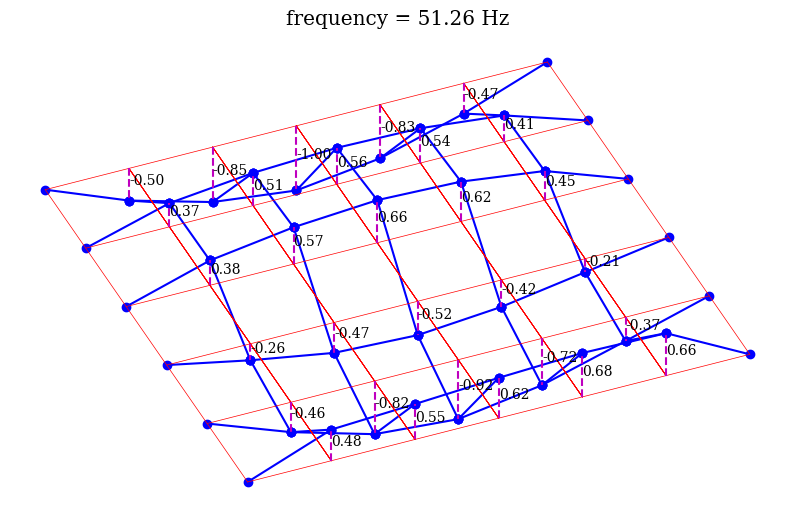

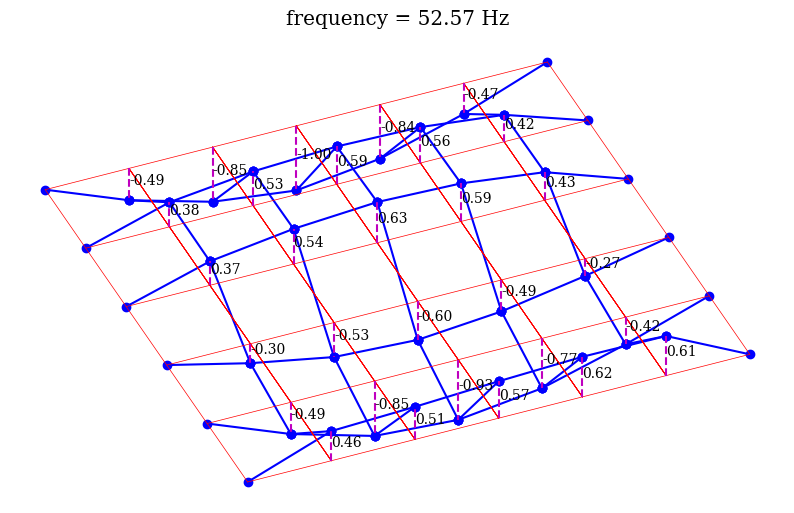

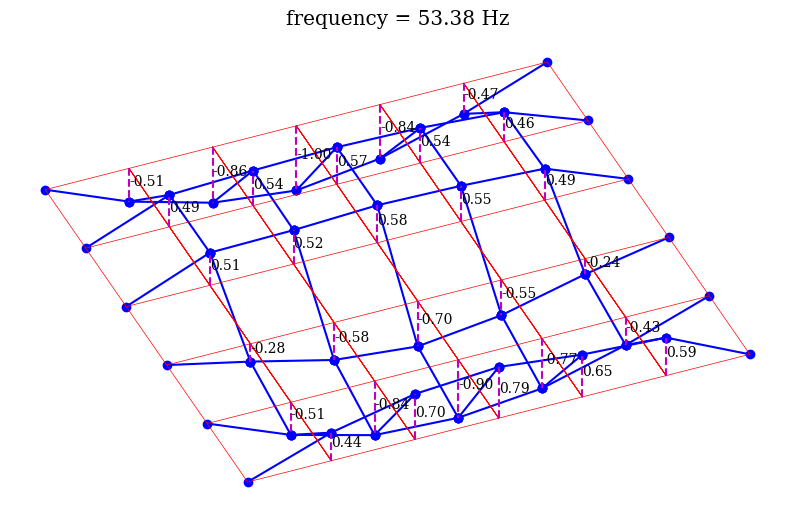

In [75]:
Qatar_Mode_Shape(SSI_Stable_phis, SSI_Stable_frequencies)

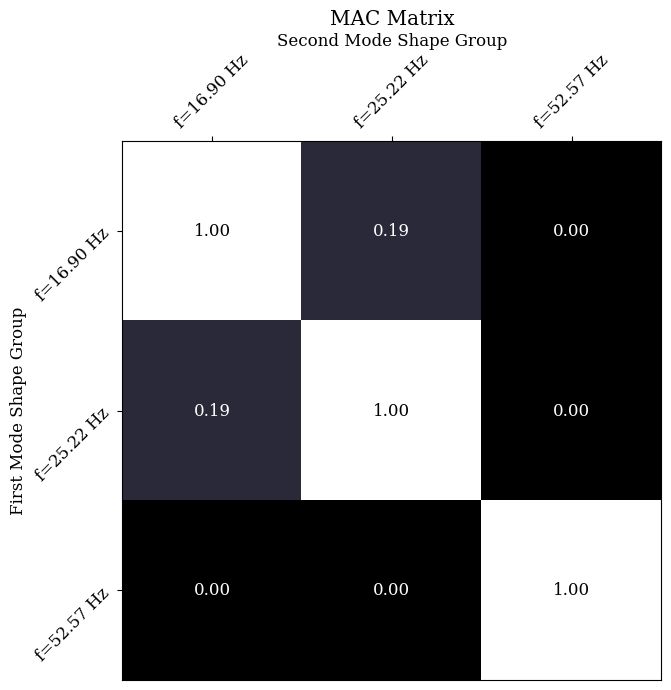

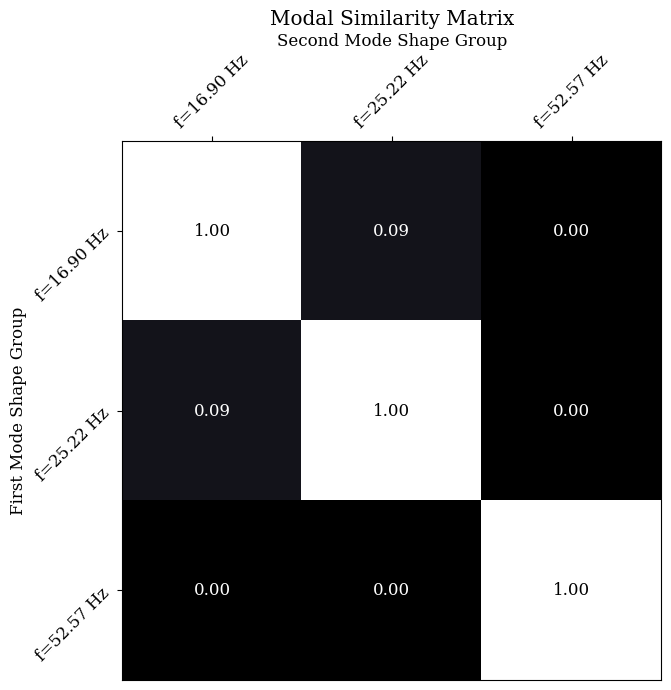

In [77]:
freqs_to_show, damps_to_show, Mode_shapes_to_show = choose_modes(SSI_Stable_frequencies, SSI_Stable_zetas, SSI_Stable_phis, mode_numbers=[0,1,5])
# coord_file_name = 'coords_qatar.csv'
draw_MAC_diagram(Mode_shapes_to_show, Mode_shapes_to_show, freqs_to_show, freqs_to_show, ('SSI-COV', 'SSI-COV'), '2D')
draw_MAC_diagram(Mode_shapes_to_show, Mode_shapes_to_show, freqs_to_show, freqs_to_show, ('SSI-COV', 'SSI-COV'), '2D', modal_similarity_criterion=True)
# draw_mode_shapes(coord_file_name, list_mode_shapes=Mode_shapes_to_show, list_freqs=freqs_to_show, list_damps=damps_to_show, base_axis='x', base_axis_align='horizontal')

### SSI-COV (UNC)

In [79]:
################################## uncomment the method you want
alg = 'cov'
uncertainty = True
nb = 50
method = 1
lag = 5 # i
order = 40 # n
unc_criteria = []
# cov:  l*i > n
# l = number of sensors

SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, SSI_Stable_phis = SSI_Alg(
    pp_sig_qatar,order=order,lag=lag,dt=dt,criteria = [0.02, 0.03, 0.02], 
    alg=alg,method=method,Num_poles_to_accept_a_mode=2,nb=nb,
    uncertainty=uncertainty, unc_criteria=unc_criteria)
print(SSI_Stable_frequencies)
print(SSI_Stable_zetas)
# print(SSI_Stable_phis)

Computing Qmax pack ... (15/150), time = 0.12s
Computing Qmax pack ... (30/150), time = 0.11s
Computing Qmax pack ... (45/150), time = 0.10s
Computing Qmax pack ... (60/150), time = 0.09s
Computing Qmax pack ... (75/150), time = 0.08s
Computing Qmax pack ... (90/150), time = 0.09s
Computing Qmax pack ... (105/150), time = 0.12s
Computing Qmax pack ... (120/150), time = 0.10s
Computing Qmax pack ... (135/150), time = 0.09s
Computing Qmax pack ... (150/150), time = 0.08s
Computing order: 4/40
Computing order: 8/40
Computing order: 12/40
Computing order: 16/40
Computing order: 20/40
Computing order: 24/40
Computing order: 28/40
Computing order: 32/40
Computing order: 36/40
Computing order: 40/40
#######################
[tensor(15.5382), tensor(16.7597), tensor(25.2785), tensor(29.7139), tensor(45.3135), tensor(51.2354), tensor(53.3566), tensor(59.2854), tensor(62.7292), tensor(62.9464)]
[tensor(0.0598), tensor(0.0223), tensor(0.0026), tensor(0.0037), tensor(0.0076), tensor(0.0044), tensor

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning:

Casting complex values to real discards the imaginary part

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning:

Casting complex values to real discards the imaginary part



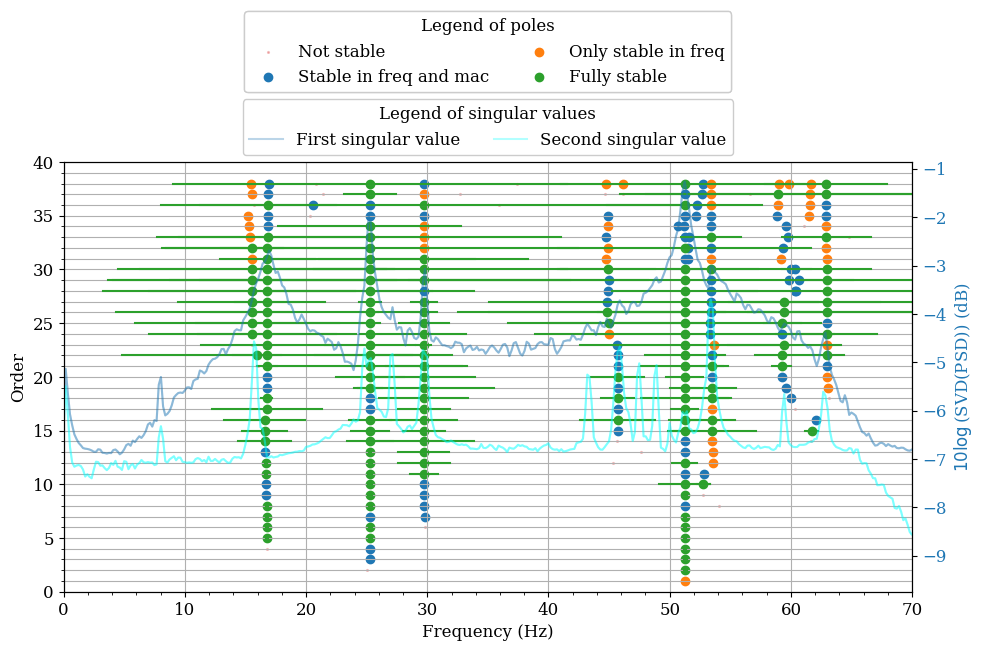

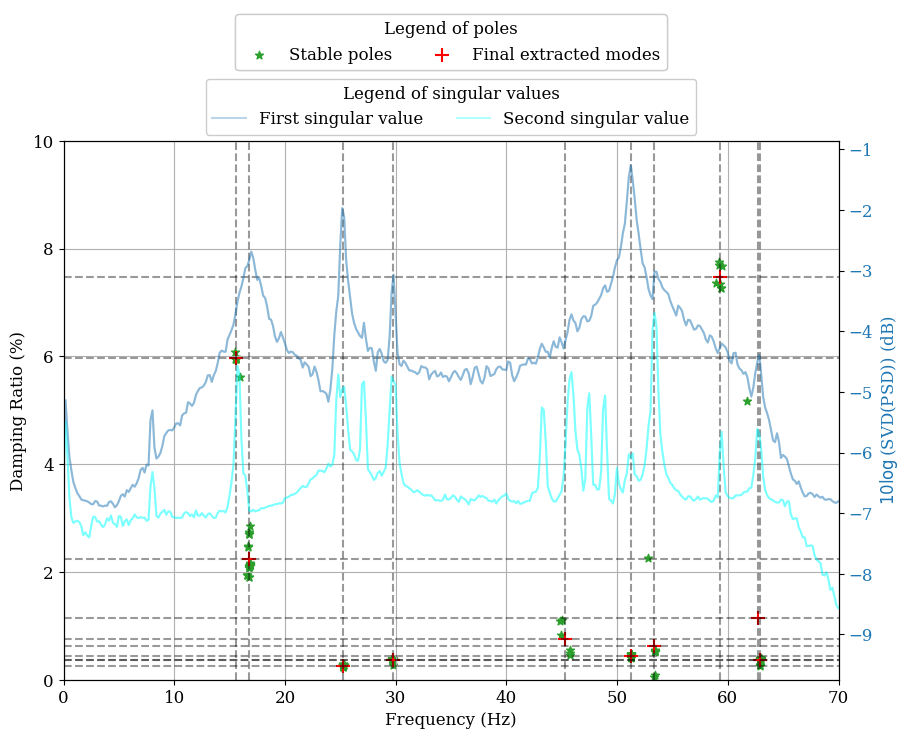

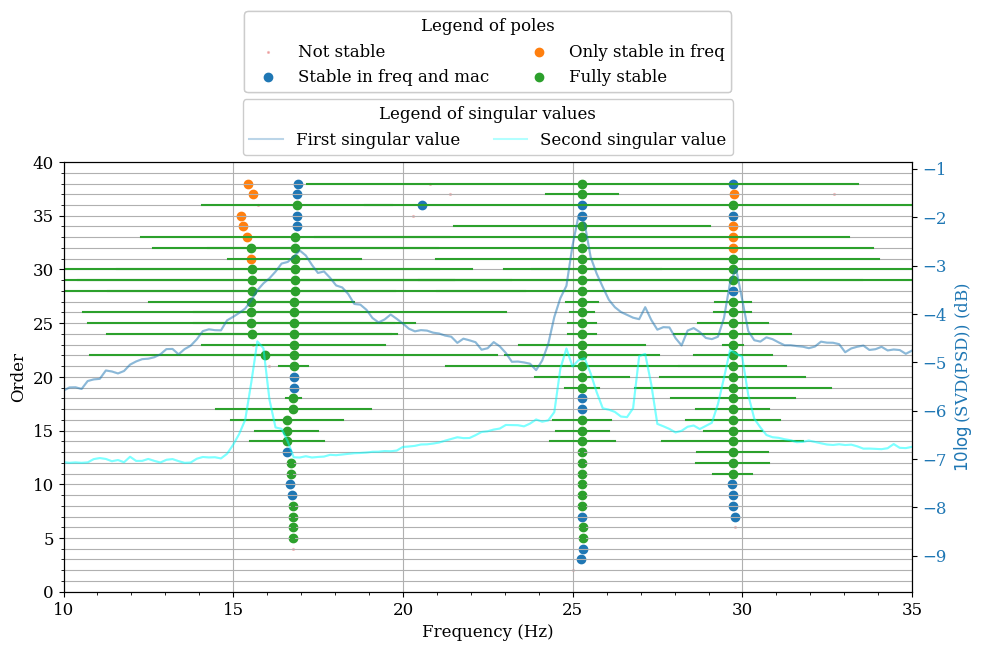

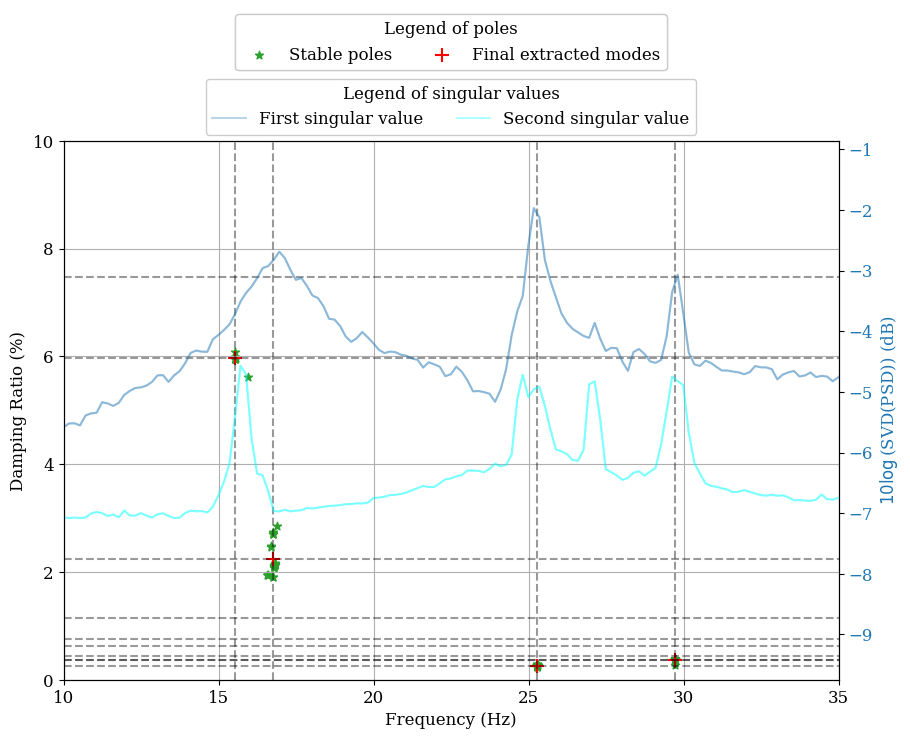

In [81]:
stabilization_diagram(SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, 
                      xlim=[0,70], ylim=[0,order], add_PSD_SVD=True, show_second_singular_value=True, 
                      f_psd=f_psd, ss1=np.log10(ss1), without_mode_shape=False, draw_unc=True, scale_unc=1)

stabilization_diagram(SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, 
                      xlim=[10,35], ylim=[0,order], add_PSD_SVD=True, show_second_singular_value=True, 
                      f_psd=f_psd, ss1=np.log10(ss1), without_mode_shape=False, draw_unc=True, scale_unc=0.5)

In [82]:
results_table(SSI_Stable_frequencies, SSI_Stable_zetas)

,Frequencies,Damping Ratios
0,15.538237,0.059759
1,16.759737,0.022339
2,25.278486,0.002612
3,29.713877,0.003667
4,45.313480,0.007599
5,51.235378,0.004380
6,53.356564,0.006325
7,59.285419,0.074801
8,62.729187,0.011453
9,62.946411,0.003677


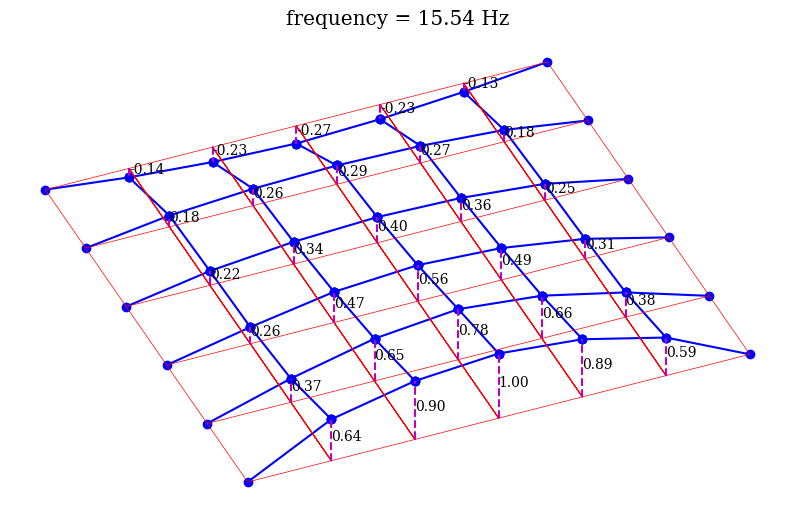

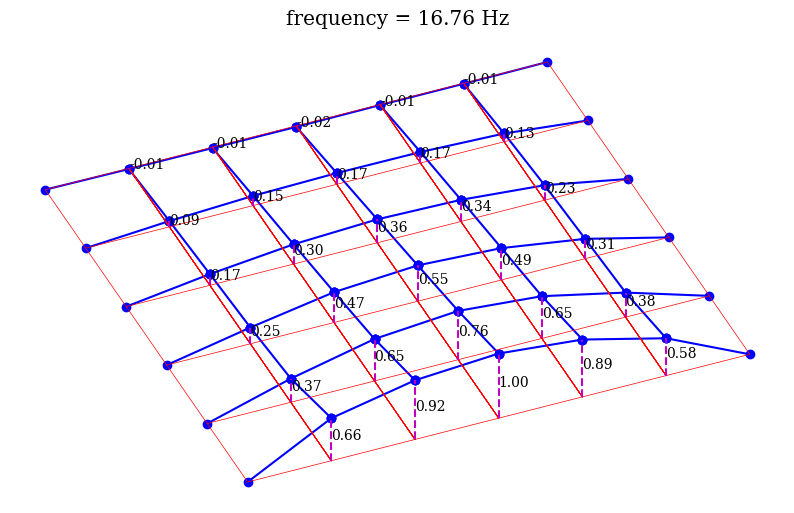

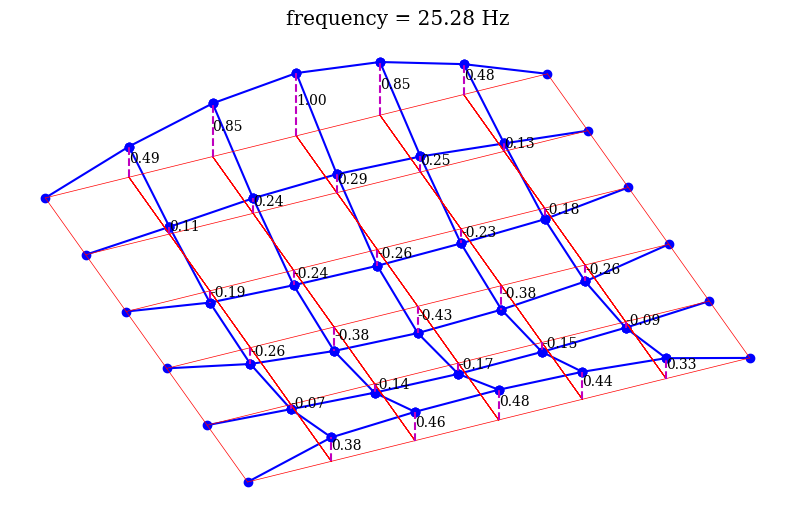

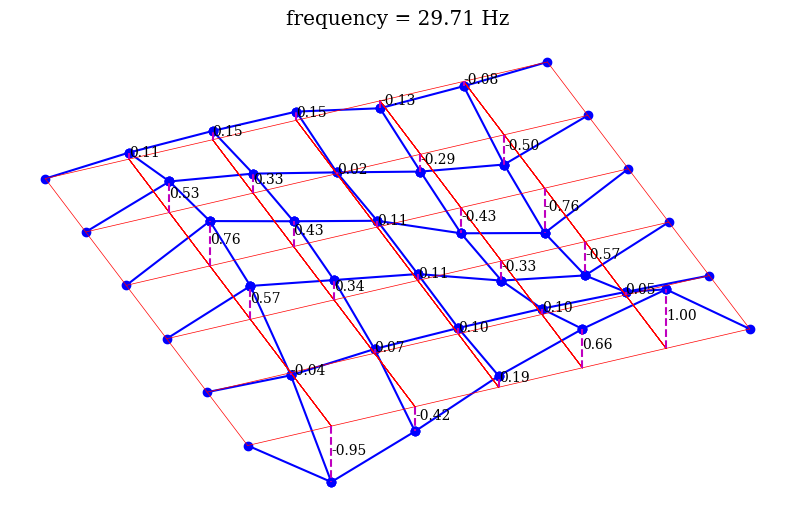

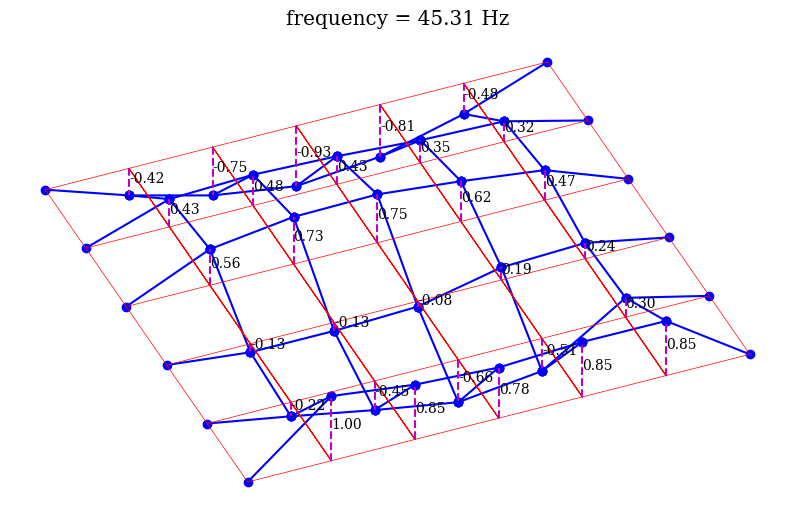

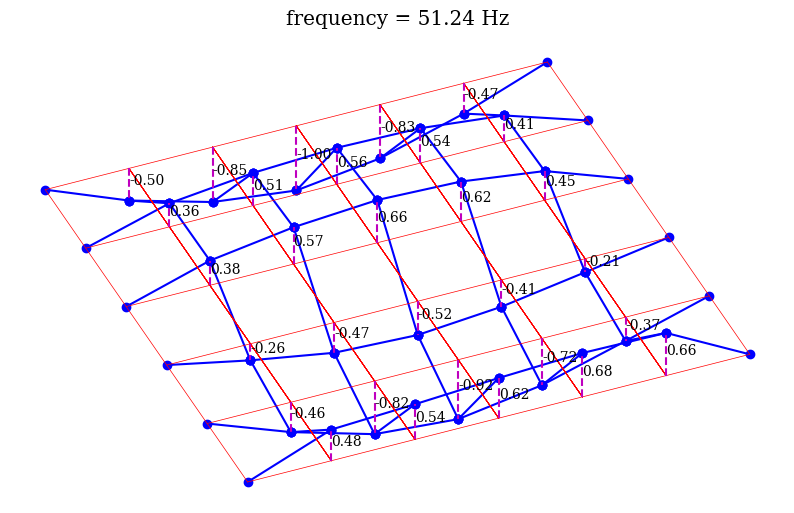

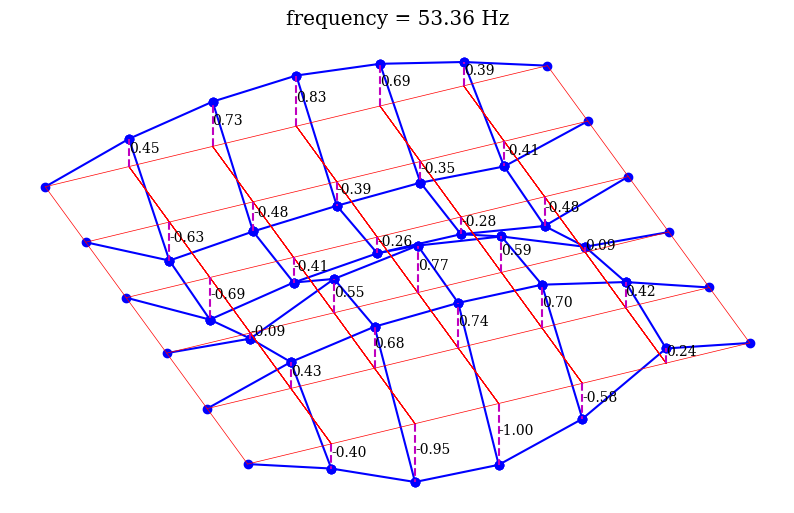

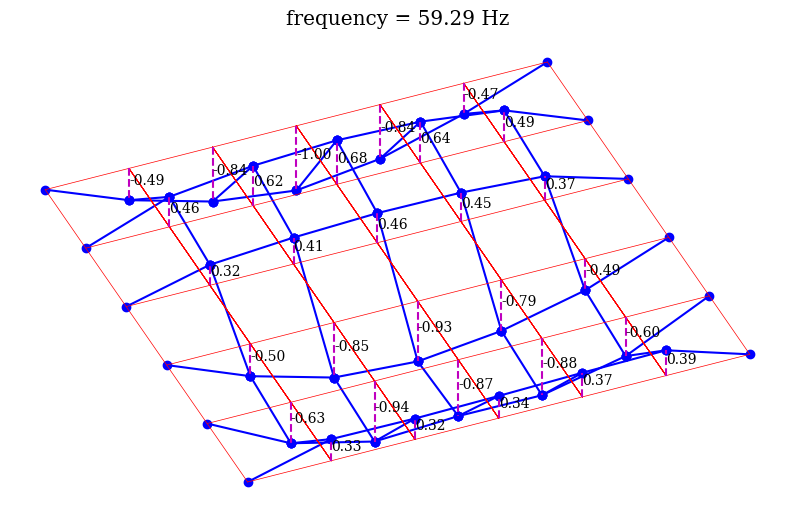

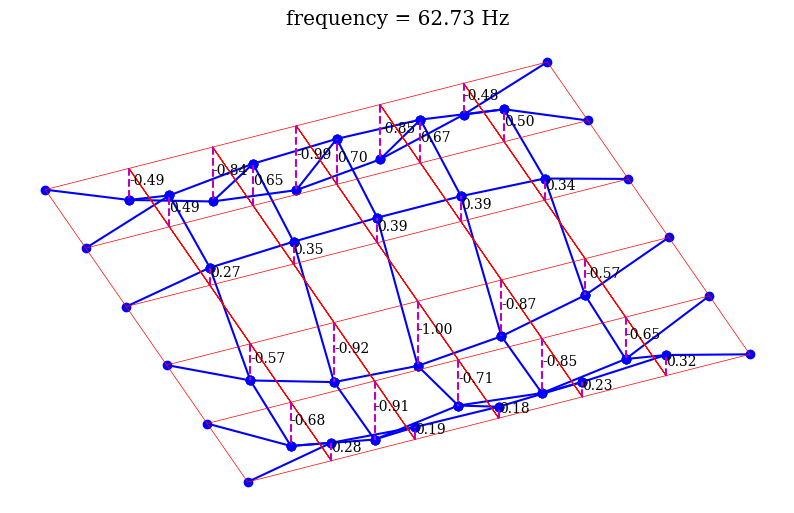

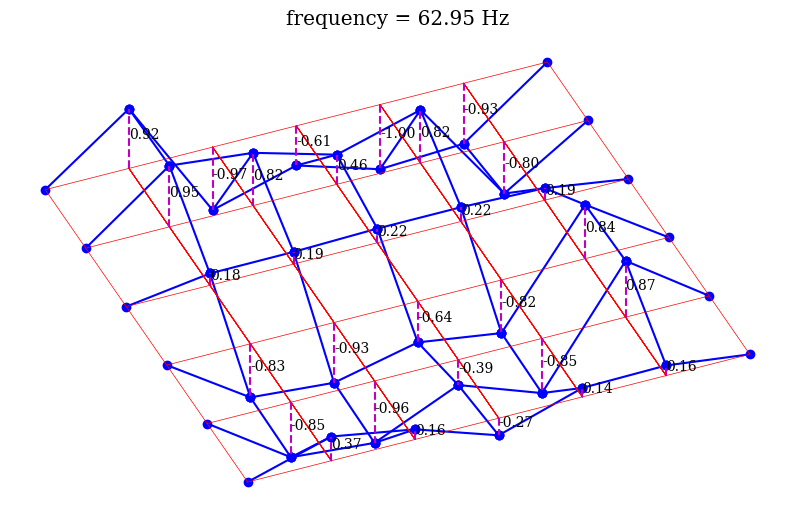

In [84]:
Qatar_Mode_Shape(SSI_Stable_phis, SSI_Stable_frequencies)

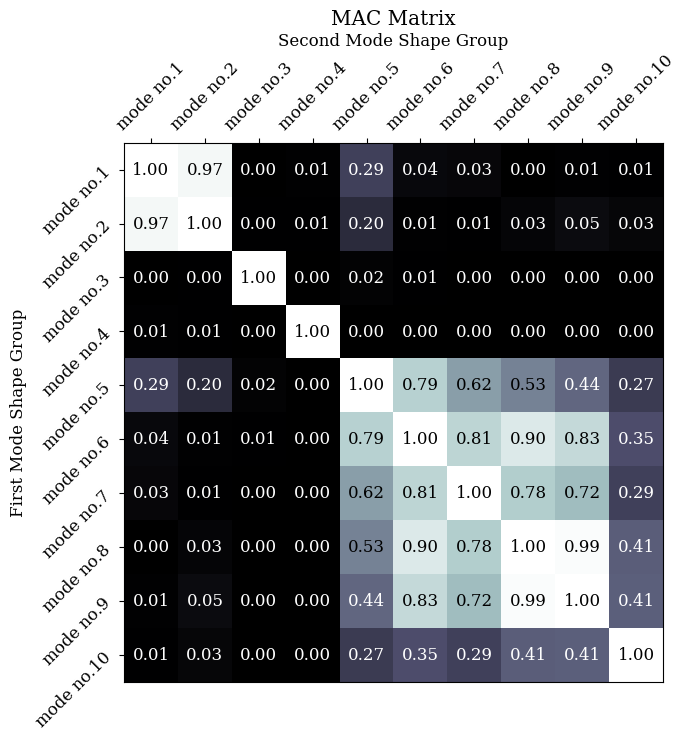

In [85]:
draw_MAC_diagram(SSI_Stable_phis,SSI_Stable_phis)

## SSI-Data

In [86]:
################################## uncomment the method you want

alg = 'data'
method = 0
lag = 14 # Number of Block Rows for DATA Alg
order = 50
# data: Number of Block Rows > order

SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, SSI_Stable_phis = SSI_Alg(pp_sig_qatar,order,lag,dt,criteria = [0.01, 0.05, 0.02],alg=alg,method=method,Num_poles_to_accept_a_mode=6)
print(SSI_Stable_frequencies)
print(SSI_Stable_zetas)
# print(Stable_phis)

[tensor(15.6462), tensor(16.9216), tensor(25.2571), tensor(29.7398), tensor(45.9530), tensor(51.2252), tensor(53.4071), tensor(59.3171), tensor(62.7718)]
[tensor(0.0026), tensor(0.0253), tensor(0.0019), tensor(0.0009), tensor(0.0022), tensor(0.0035), tensor(0.0002), tensor(0.0295), tensor(0.0010)]


c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning:

Casting complex values to real discards the imaginary part

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning:

Casting complex values to real discards the imaginary part



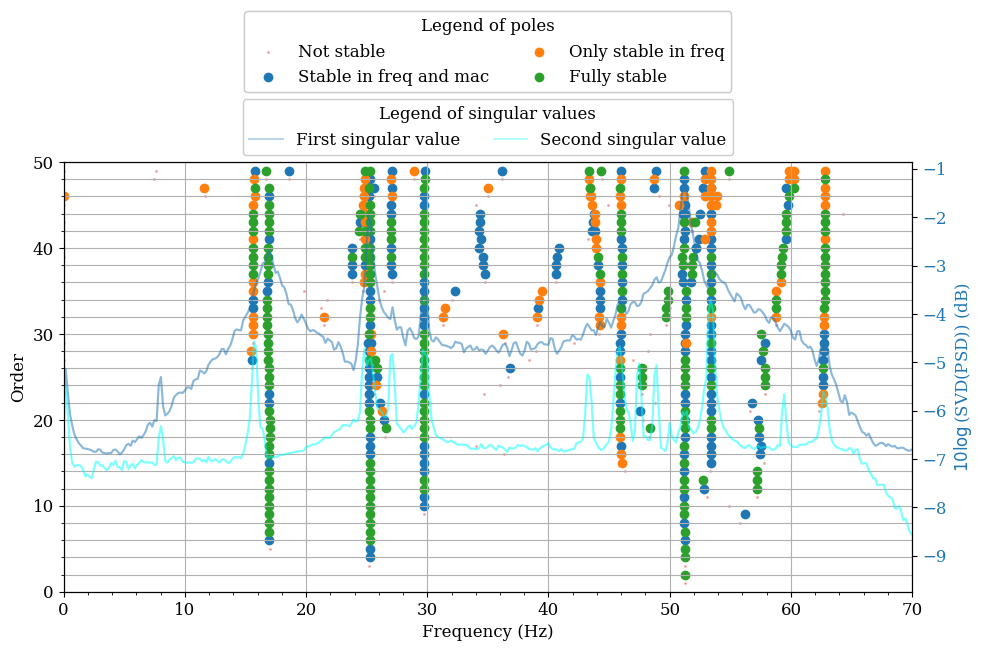

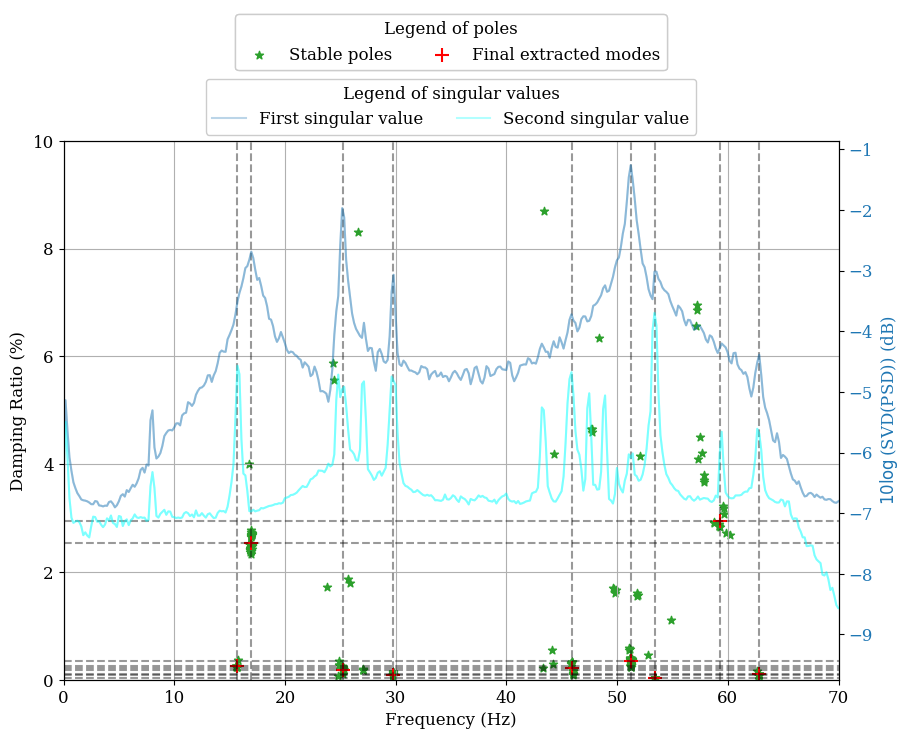

In [87]:
stabilization_diagram(SSI_Coord_dict, SSI_Stable_frequencies, SSI_Stable_zetas, xlim=[0,70], ylim=[0,50], add_PSD_SVD=True, f_psd=f_psd, ss1=np.log10(ss1), show_second_singular_value=True)

In [ ]:
results_table(SSI_Stable_frequencies,SSI_Stable_zetas)

,Frequencies,Damping Ratios
0,15.646229,0.002581
1,16.921589,0.025278
2,25.257130,0.001892
3,29.739771,0.000936
4,45.952999,0.002165
5,51.225170,0.003481
6,53.407120,0.000233
7,59.317139,0.029470
8,62.771751,0.000986


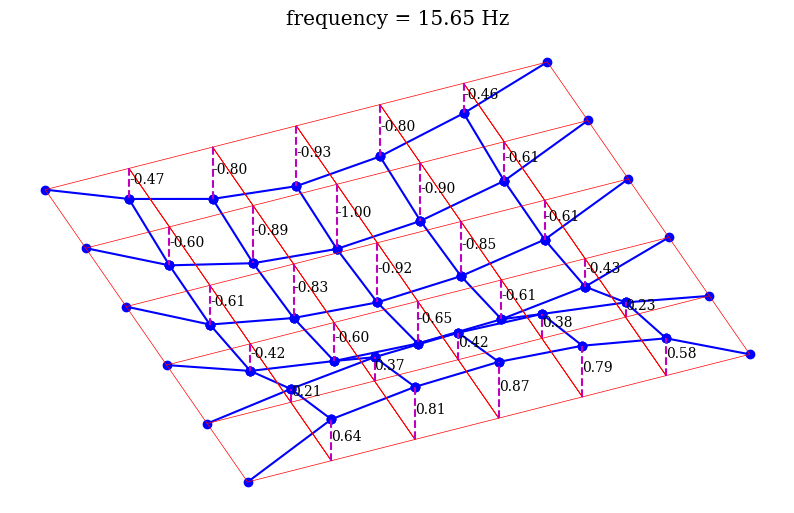

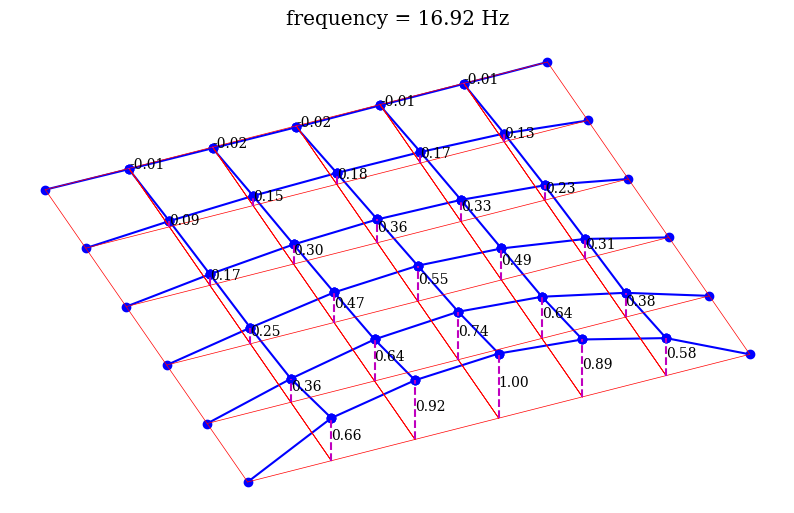

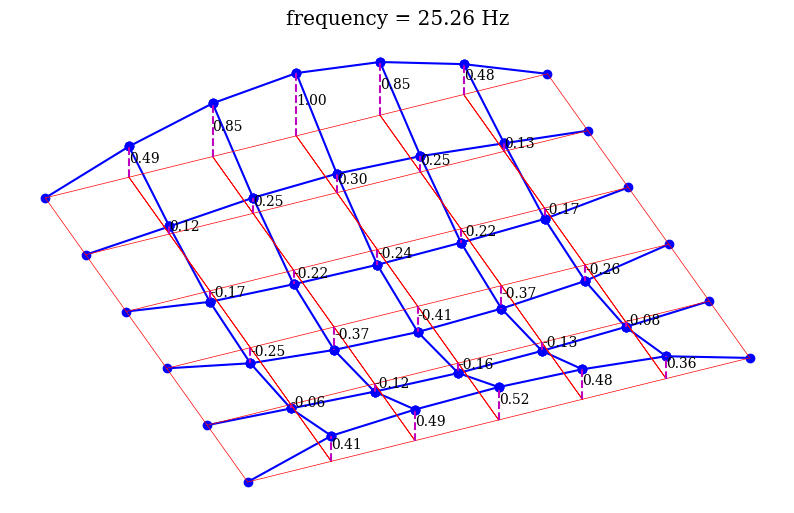

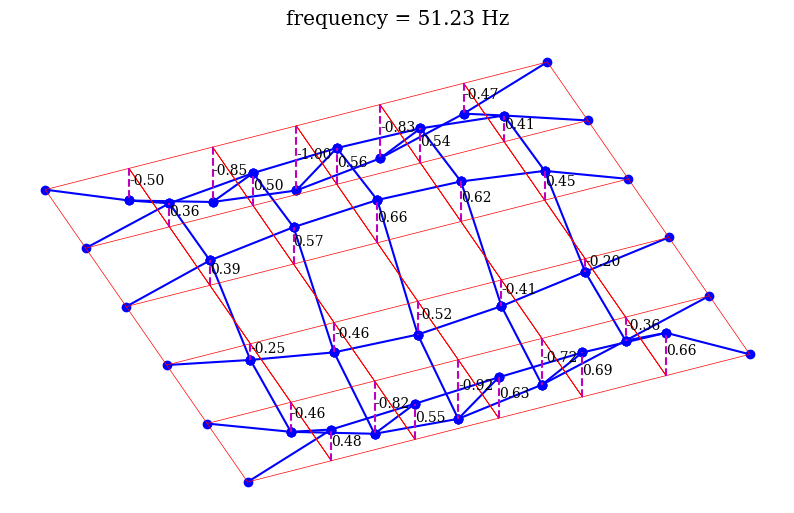

In [89]:
freqs_to_show, damps_to_show, Mode_shapes_to_show = choose_modes(SSI_Stable_frequencies, SSI_Stable_zetas, SSI_Stable_phis, mode_numbers=[0, 1, 2, 5])
Qatar_Mode_Shape(Mode_shapes_to_show, freqs_to_show)


# PolyMAX on Qatar

## PolyMAX

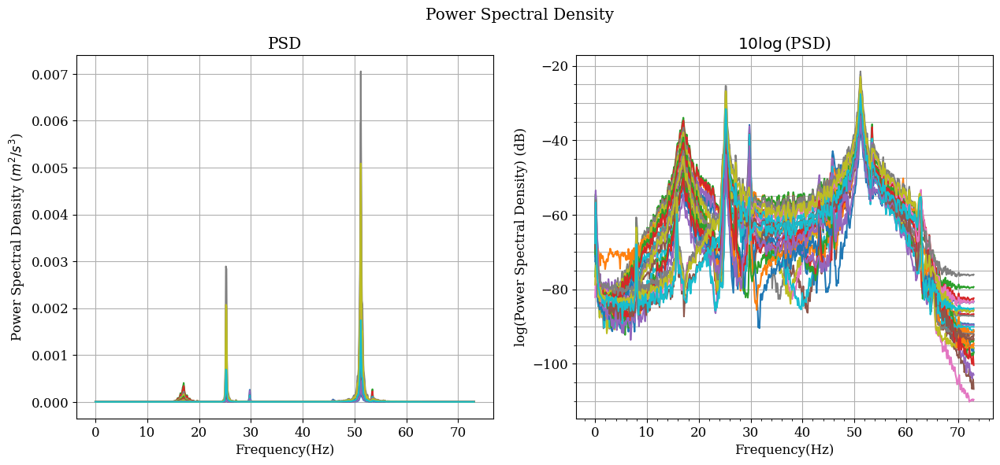

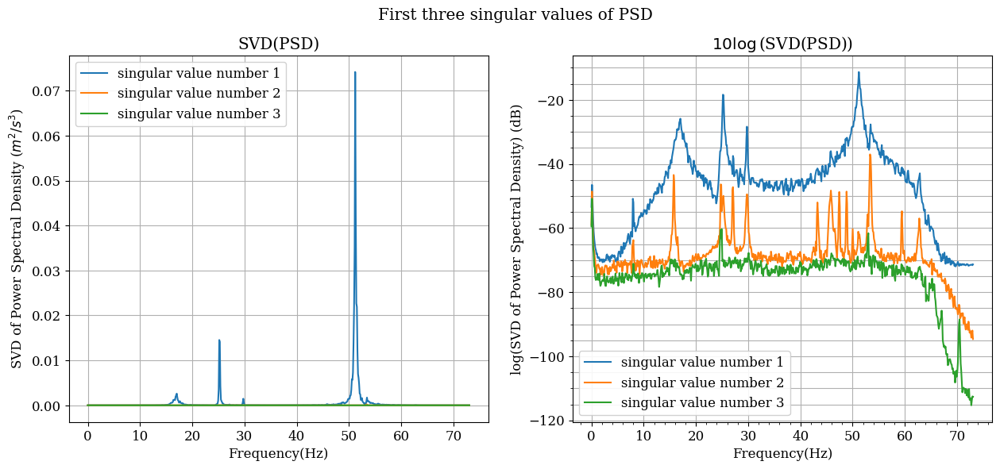

In [91]:
PSD_mat, f_psd = psd_func(pp_sig_qatar, dt,show_semilog=False,nseg=6,pov=0.5)
ss1, UU = svd_psd(PSD_mat, f_psd,show_semilog=False)
# ss1, UU = svd_psd(PSD_new[0], PSD_new[1], nxseg, num_chnl,show_semilog=False)

In [98]:
order = 50
PM_Coord_dict, PM_Stable_frequencies, PM_Stable_zetas, PM_Stable_phis = PolyMAX(pp_sig_qatar, dt, order, nseg=10, pov=0.5, criteria=[0.05, 0.05, 0.02], basis_order=1,
           no_mode_shape_stability=True, positve_psd=True, real_RST=True, real_M=True,
           mode_shape_based_on_all_found_modes=True,Num_poles_to_accept_a_mode=10)

Calculating M matrix for order: 1 ...
Calculating M matrix for order: 2 ...
Calculating M matrix for order: 3 ...
Calculating M matrix for order: 4 ...
Calculating M matrix for order: 5 ...
Calculating M matrix for order: 6 ...
Calculating M matrix for order: 7 ...
Calculating M matrix for order: 8 ...
Calculating M matrix for order: 9 ...
Calculating M matrix for order: 10 ...
Calculating M matrix for order: 11 ...
Calculating M matrix for order: 12 ...
Calculating M matrix for order: 13 ...
Calculating M matrix for order: 14 ...
Calculating M matrix for order: 15 ...
Calculating M matrix for order: 16 ...
Calculating M matrix for order: 17 ...
Calculating M matrix for order: 18 ...
Calculating M matrix for order: 19 ...
Calculating M matrix for order: 20 ...
Calculating M matrix for order: 21 ...
Calculating M matrix for order: 22 ...
Calculating M matrix for order: 23 ...
Calculating M matrix for order: 24 ...
Calculating M matrix for order: 25 ...
Calculating M matrix for order: 26

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning:

Casting complex values to real discards the imaginary part

c:\Users\Mehrab\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning:

Casting complex values to real discards the imaginary part



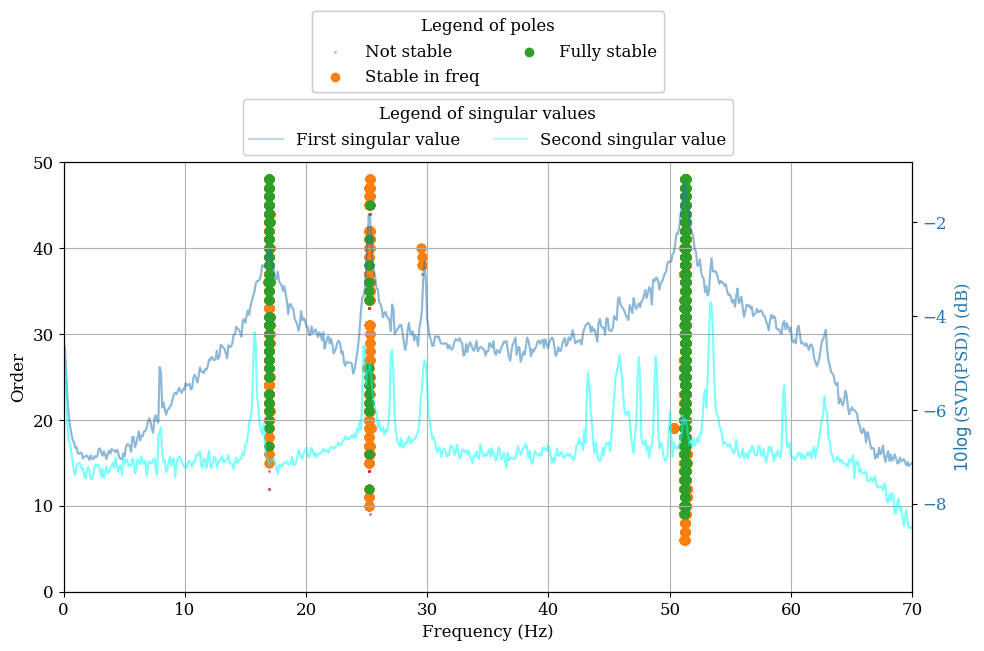

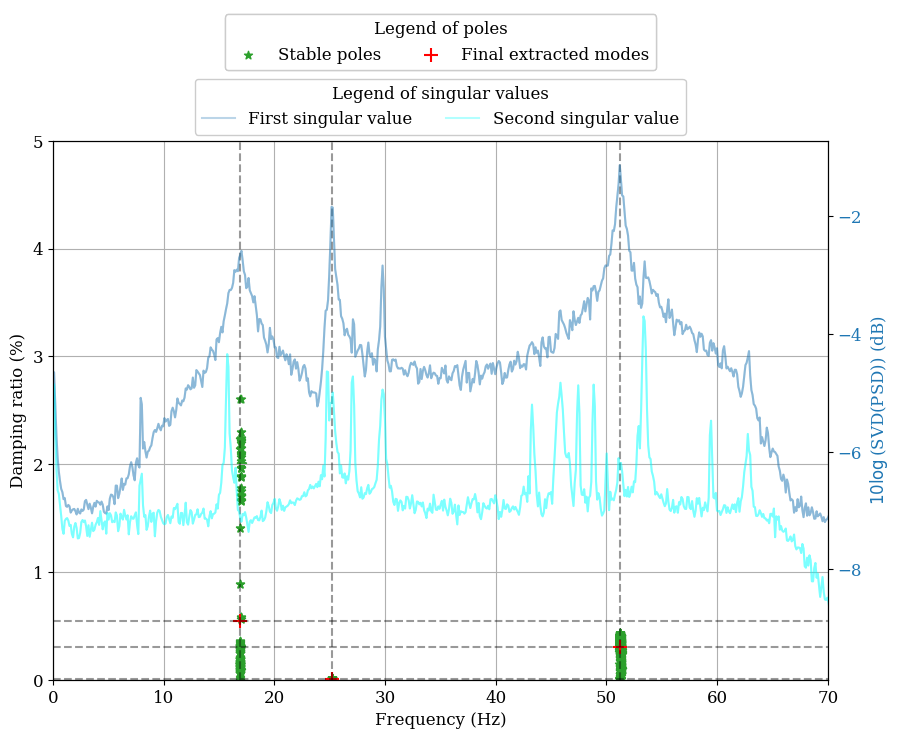

In [99]:
stabilization_diagram(PM_Coord_dict, PM_Stable_frequencies, PM_Stable_zetas, damp_ylim=[0,5], ylim=[0,50], xlim=[0,70], add_PSD_SVD=True, f_psd=f_psd, ss1=np.log10(ss1), show_second_singular_value=True, without_mode_shape=False)

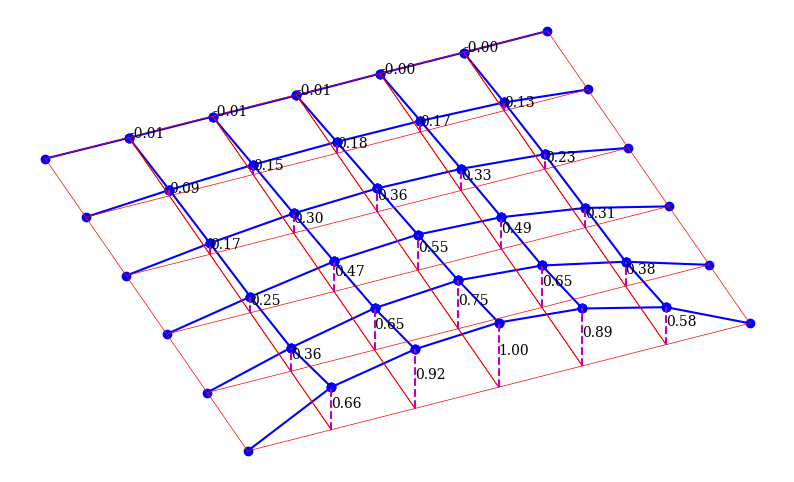

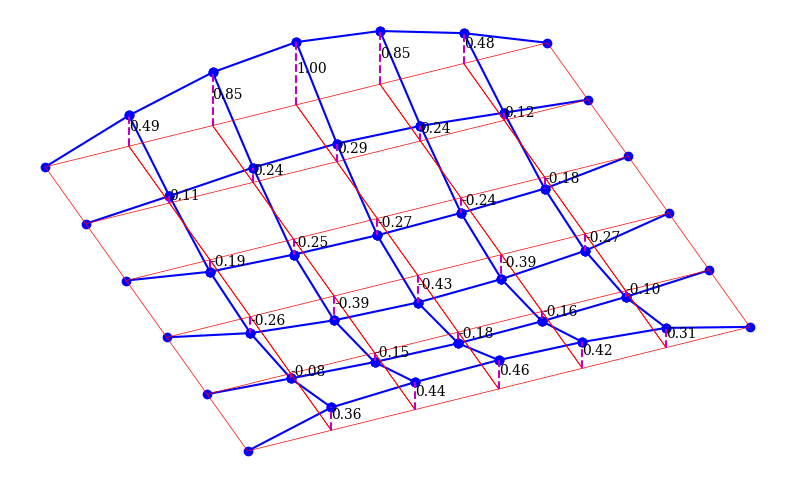

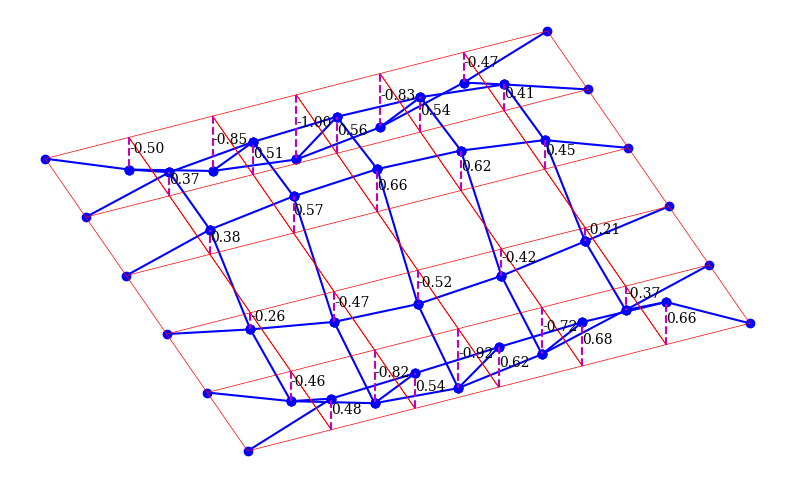

In [100]:
Qatar_Mode_Shape(PM_Stable_phis)

In [101]:
results_table(PM_Stable_frequencies, PM_Stable_zetas)

,Frequencies,Damping Ratios
0,16.935345,0.005425
1,25.226559,0.000081
2,51.248119,0.003046


# ITD on Qatar

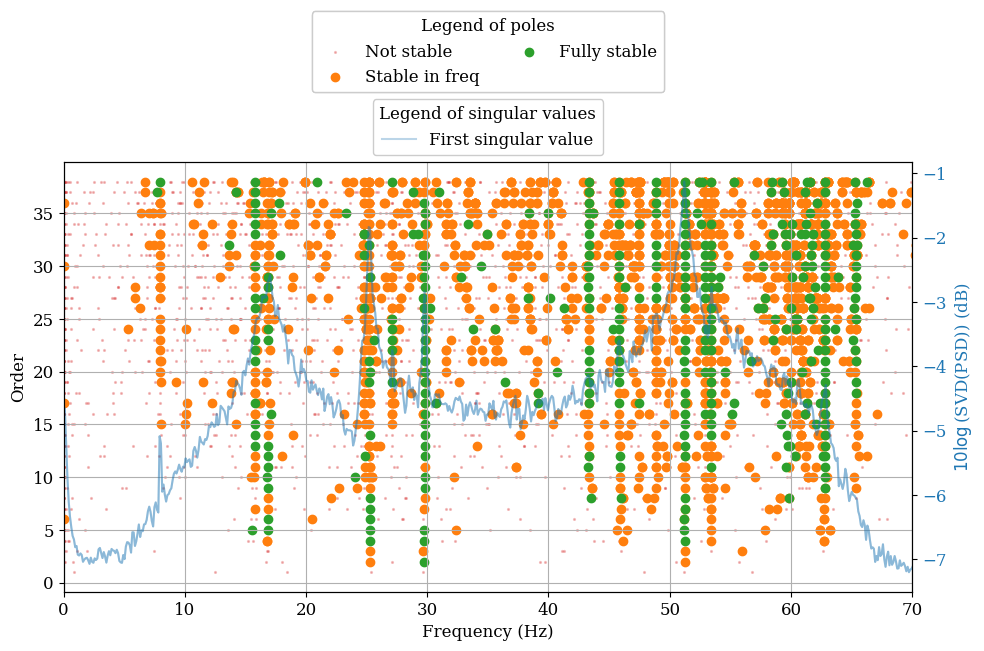

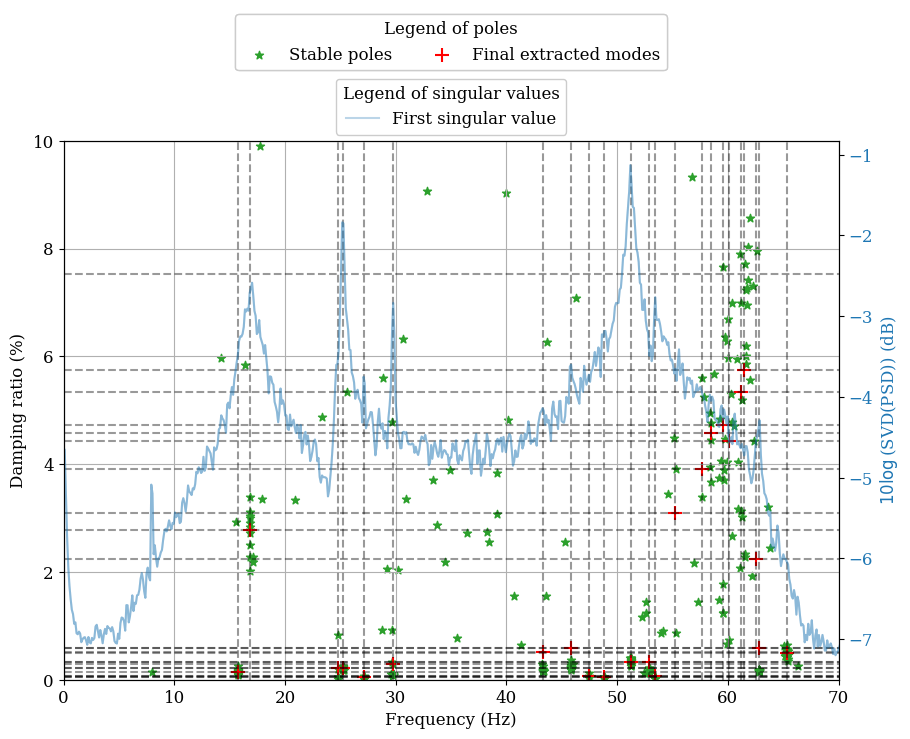

In [113]:
order = 40
ITD_Coord_dict, ITD_Stable_frequencies, ITD_Stable_zetas = ITD_alg(pp_sig_qatar[:,0:30:4], dt, order=order, criteria=[0.01,0.2,0.02], Num_poles_to_accept_a_mode=3)
stabilization_diagram(ITD_Coord_dict, ITD_Stable_frequencies, ITD_Stable_zetas ,xlim=[0,70], add_PSD_SVD=True, f_psd=f_psd, ss1=np.log10(ss1))

In [114]:
results_table(ITD_Stable_frequencies, ITD_Stable_zetas)

,Frequencies,Damping Ratios
0,15.779604,0.001524
1,16.860136,0.027781
2,24.791014,0.002254
3,25.255433,0.002161
4,27.097941,0.000497
5,29.759369,0.002991
6,43.337182,0.005080
7,45.870322,0.005888
8,47.443221,0.000761
9,48.856564,0.000414


Calculating PSD...
Finding mode shapes ...


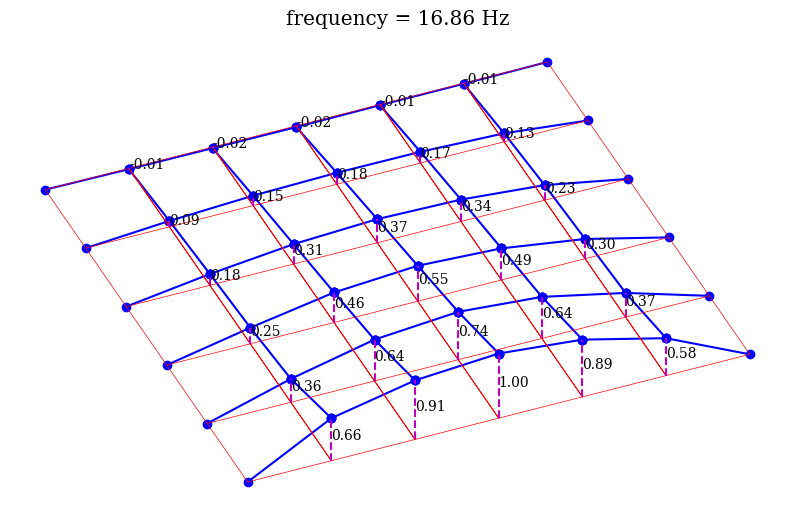

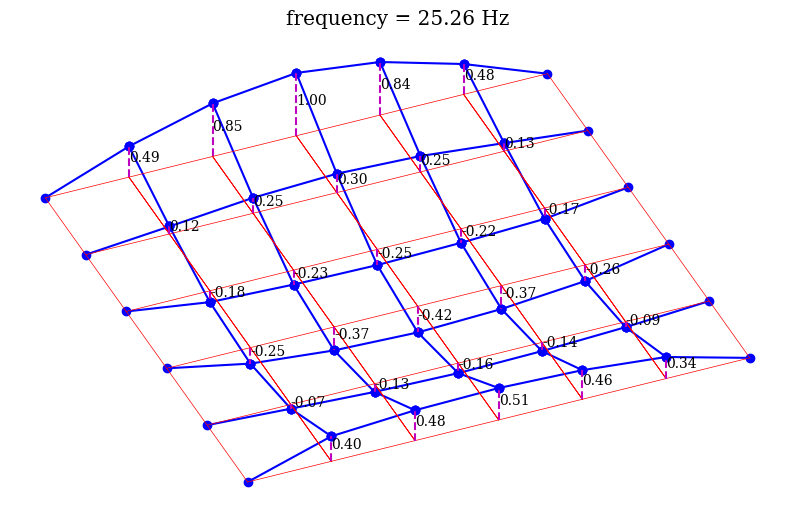

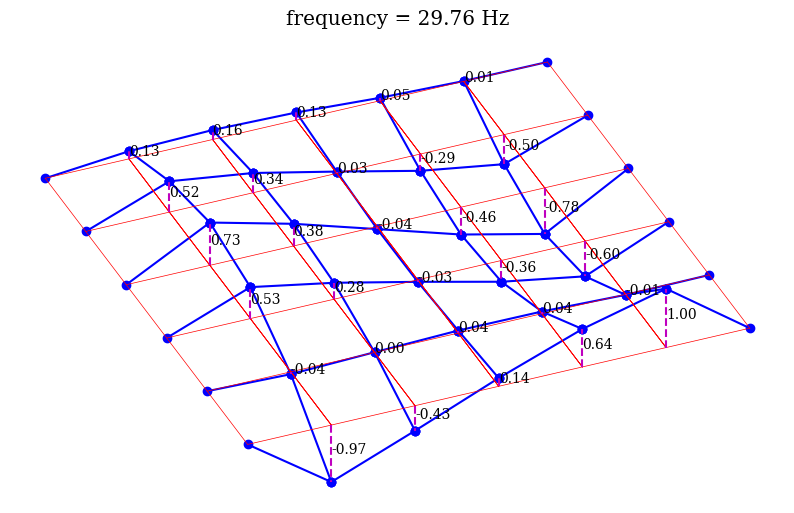

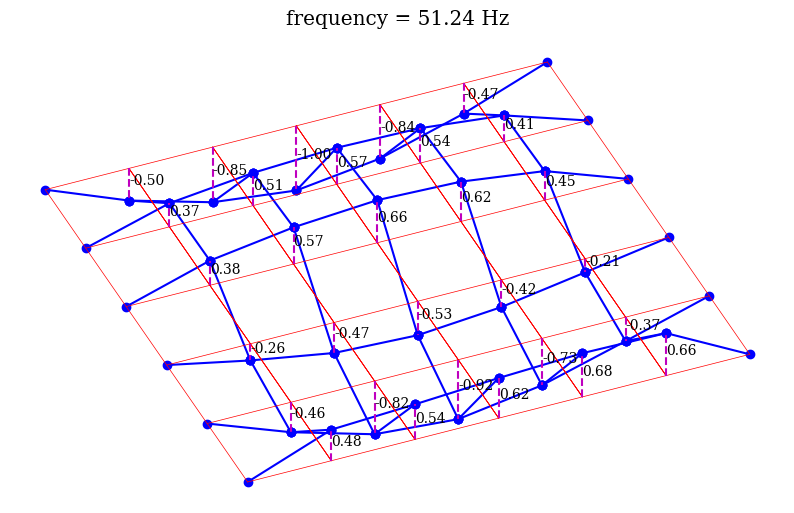

In [137]:
freqs_to_show, damps_to_show, _ = choose_modes(ITD_Stable_frequencies, ITD_Stable_zetas, mode_numbers=[1,3,5,10])
Mode_shapes_to_show = independent_mode_shape(freqs_to_show, damps_to_show, pp_sig_qatar, dt, nseg=20, pov=0.5, window='hann')


Qatar_Mode_Shape(Mode_shapes_to_show, freqs_to_show)